In [308]:
import os
import re
import json
import pickle
from pathlib import Path
import yaml
from copy import deepcopy

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import scipy
import skimage
import pandas as pd
import torch
import tifffile
from sklearn.metrics import adjusted_rand_score
from scipy.cluster.hierarchy import dendrogram
from einops import rearrange, repeat

In [309]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
plt.rcParams['svg.fonttype'] = 'none'

In [310]:
%load_ext autoreload

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [311]:
%autoreload 2

In [312]:
import mushroom.utils as utils
import mushroom.visualization.utils as vis_utils
import mushroom.data.datasets as datasets
import mushroom.data.visium as visium
import mushroom.data.xenium as xenium
import mushroom.data.multiplex as multiplex
import mushroom.data.he as he
import mushroom.registration.bigwarp as bigwarp
from mushroom.mushroom import Mushroom, DEFAULT_CONFIG

In [313]:
project_dir = '/data/estorrs/mushroom/data/projects/submission_v1'
output_dir = os.path.join(project_dir, 'analysis', 'dataset_summary')
Path(output_dir).mkdir(parents=True, exist_ok=True)

In [314]:
def alter_filesystem(config, source_root, target_root):
    for entry in config['sections']:
        for mapping in entry['data']:
            mapping['filepath'] = mapping['filepath'].replace(source_root, target_root)
    
    if config['trainer_kwargs']['data_mask'] is not None:
        config['trainer_kwargs']['data_mask'] = config['trainer_kwargs']['data_mask'].replace(source_root, target_root)
        
    return config

In [315]:
source_root = '/diskmnt/Projects/Users/estorrs/mushroom/data'
target_root = '/data/estorrs/mushroom/data'

In [316]:
run_dir = '/data/estorrs/mushroom/data/projects/submission_v1'

## HT397B1

In [317]:
case = 'HT397B1'
z_scaler = .2
cluster_resolutions = [1., 1., 1.]
target_res = 50
visium_target_res = 100

In [318]:
# fix issues where antibody names aren't consistent accross some images
channel_to_idents = {
    'Pan-Cytokeratin': ['Pan-Cytokeratin', 'Pan-CK', 'PanCK', 'PanCytokeratin'],
    'E-cadherin': ['E-cadherin', 'E-Cadherin'],
    'CD45': ['CD45'],
    'CD45RO': ['CD45RO'],
    'CD45RA': ['CD45RA'],
    'CD8': ['CD8', 'CD8a'],
    'DAPI': ['DAPI'],
    'CD4': ['CD4'],
    'CD3e': ['CD3e', 'CD3'],
    'Vimentin': ['Vimentin', 'Vim', 'VIM'],
    'SMA': ['SMA', 'a-SMA'],
    'CD31': ['CD31'],
    'CD20': ['CD20', 'CD20-Akoya'],
    'CD68': ['CD68'],
    'CD163': ['CD163'],
    'FOXP3': ['FoxP3', 'FOXP3', 'Foxp3'],
    'cKit': ['cKit', 'cKIT', 'ckit-(D)', 'ckit'],
    'MGP': ['MGP'],
    'CD36': ['CD36'],
    'PR': ['PR'],
    'ER': ['ER'],
    'P21': ['P21'],
    'P16': ['P16'],
    'CK5': ['Keratin 5', 'KRT5', 'CK5'],
    'CK7': ['CK7'],
    'CK8/18': ['CK8/18'],
    'TFF1': ['TFF1'],
    'beta-integrin': ['beta-integrin', 'beta3-integrin'],
    'CK14': ['CK14', 'Keratin 14', 'KRT14'],
    'CK17': ['CK17', 'Keratin 17', 'CK17'],
    'CK19': ['CK19', 'Keratin 19', 'KRT19'],
    'CD11b': ['CD11b', 'CD11B', 'cd11b'],
    'GATA3': ['GATA3'],
    'PLAT/tPA': ['PLAT/tPA', 'PLAT'],
    'COX6c': ['COX6c', 'COX6C (D)', 'COX6C'],
    'Her2': ['Her2', 'HER2'],
    'Bap1': ['Bap1', 'BAP1'],
    'GLUT1': ['Glut1', 'GLUT1'],
    'CD11c': ['CD11c'],
    'HLA-DR': ['HLA-DR', 'HLADR'],
    'Ki67': ['Ki67', 'KI67'],
    'Podoplanin': ['Podoplanin', 'PDPN'],
    'CTLA4': ['CTLA4'],
    'SLC39A6': ['SLC39A6'],
    'BCA1': ['BCA1'],
    'BCAL': ['BCAL'],
    'TUBB3': ['TUBB3'],
    'PTPRZ1': ['PTPRZ1'],
    'HIF1A': ['HIF1a', 'HIF1A'],
    'PAI1': ['PAI1'],
    'GFAP': ['GFAP'],
    'VEGFA': ['VEGFA'],
    'IBA1': ['IBA1'],
    'OLIG2': ['OLIG2'],
    'FN1': ['FN1'],
    'a-Amylase': ['a-Amylase', 'Amylase (D', 'Amylase'],
    'Hep-Par-1': ['Hep-Par-1', 'HepPar1-(D)', 'HepPar1'],
    'Granzyme-B': ['Granzyme B', 'GZMB'],
    'TCF-1': ['TCF-1'],
    'CD39': ['CD39'],
    'PD1': ['PD-1', 'PD1'],
    'PDL1': ['PD-L1', 'PDL1'],
    'Histone-H3-Pho': ['Histone H3 Pho'],
    'Maspin': ['Maspin'],
    'MMP9': ['MMP9'],
    'CD44': ['CD44'],
    'CD107A': ['CD107a'],
    'FGFR3': ['FGFR3'],
    'CD138': ['CD138'],
    'MLPH': ['MLPH'],
    'P63': ['P63', 'p63'],
    'GP2': ['GP2'],
    'COX2': ['COX2'],
    'Lyve-1': ['Lyve-1', 'LYVE1'],
    'CCL2': ['CCL2'],
    'MUC2': ['MUC2'],
    'SOX9': ['SOX9'],
    'STEAP4': ['STEAP4'],
    'AR': ['AR'],
    'AMACR': ['AMACR'],
    'PGC': ['PGC', 'PGC (D)'],
    'CFTR': ['CFTR (D)', 'CFTR'],
    'REG3A': ['REG3A (D)', 'REG3A'],
    'LAMC2': ['LAMC2 (D)', 'LAMC2'],
    'INS': ['INS (D)', 'INS'],
    'CRP': ['CRP (D)', 'CRP'],
    'CD74': ['CD74 (D)', 'CD74'],
    'MUC5AC': ['MUC5AC (D)', 'MUC5AC'],
    'AQP1': ['AQP1'],
    'AQP2': ['Aqp2', 'AQP2'], 
    'LRP2': ['LRP2'],
    'UMOD': ['UMOD'],
    'CALB1': ['CALB1'],
    'CP': ['CP'],
    'CA9': ['CA9'],
    'UCHL1': ['UCHL1'],
}
channel_mapping = {v:k for k, vs in channel_to_idents.items() for v in vs}

# add in (D) variants
variants = ['(D)', ' (D)', '(d)', ' (d)', '-(D)', '-(d)', ' (Dnew)', '(Dnew)', '-(Dnew)']
channel_mapping.update({k + variant:v
                      for k, v in channel_mapping.items()
                      for variant in variants})

In [319]:
dtype_to_weights = {
    'he': 0., # ignoring visium H&E
    'visium': 1.,
    'multiplex': 1.,
    'batch2_he': 1.
}

In [320]:
metadata = yaml.safe_load(open(os.path.join(run_dir, case, 'registered', 'metadata.yaml')))

config = deepcopy(DEFAULT_CONFIG)

mask_fp = os.path.join(run_dir, case, 'masks', 'tissue_mask.tif')
if not os.path.exists(mask_fp):
    mask_fp = None
# mask_fp = None # running without masks

config = utils.recursive_update(config, {
    'sections': metadata['sections'],
    'trainer_kwargs': {
        'input_resolution': metadata['resolution'],
        'target_resolution': target_res,
        'out_dir': os.path.join('/data/estorrs/mushroom/data/projects/subclone', case, f'mushroom_{target_res}res'),
        'accelerator': 'gpu',
        'steps_per_epoch': 1000,
        'data_mask': mask_fp,
    }
})

config['dtype_specific_params'] = utils.recursive_update(config['dtype_specific_params'], {
    'visium': {
        'trainer_kwargs': {
            'target_resolution': visium_target_res  # lower resolution for visium
        }
    },
    'multiplex': {
        'trainer_kwargs': {
            'channel_mapping': channel_mapping
        }
    }
})

config = alter_filesystem(config, source_root, target_root)
config

{'sections': [{'data': [{'dtype': 'visium',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/registered/s0_HT397B1-U1_visium.h5ad'},
    {'dtype': 'he',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/registered/s0_HT397B1-U1_he.tif'}],
   'position': 0,
   'sid': 'HT397B1-U1'},
  {'data': [{'dtype': 'multiplex',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/registered/s1_HT397B1-U2_multiplex.ome.tiff'}],
   'position': 5,
   'sid': 'HT397B1-U2'},
  {'data': [{'dtype': 'batch2_he',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/registered/s2_HT397B1-U4_batch2_he.tif'}],
   'position': 15,
   'sid': 'HT397B1-U4'},
  {'data': [{'dtype': 'batch2_he',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/registered/s3_HT397B1-U8_batch2_he.tif'}],
   'position': 35,
   'sid': 'HT397B1-U8'},
  {'data': [{'dtype': 'batch2_he',
     'filepath': '/data/est

In [321]:
mushroom = Mushroom.from_config(config)

INFO:root:loading spore for batch2_he
INFO:root:data mask detected
INFO:root:starting batch2_he processing
INFO:root:6 sections detected: ['HT397B1-U4', 'HT397B1-U8', 'HT397B1-U11', 'HT397B1-U16', 'HT397B1-U20', 'HT397B1-U28']
INFO:root:processing sections
INFO:root:generating image data for section HT397B1-U4


0.007287140063108625


INFO:root:generating image data for section HT397B1-U8
INFO:root:generating image data for section HT397B1-U11
INFO:root:generating image data for section HT397B1-U16
INFO:root:generating image data for section HT397B1-U20
INFO:root:generating image data for section HT397B1-U28


batch2_he torch.Size([3, 135, 133])


INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 6 sections detected: [('HT397B1-U4', 'batch2_he'), ('HT397B1-U8', 'batch2_he'), ('HT397B1-U11', 'batch2_he'), ('HT397B1-U16', 'batch2_he'), ('HT397B1-U20', 'batch2_he'), ('HT397B1-U28', 'batch2_he')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
INFO:root:loading spore for he
INFO:root:data mask detected
INFO:root:starting he processing
INFO:root:2 sections detected: ['HT397B1-U1', 'HT397B1-U21']
INFO:root:processing sections
INFO:root:generating image data for section HT397B1-U1


0.007287140063108625


INFO:root:generating image data for section HT397B1-U21


he torch.Size([3, 135, 133])


INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 2 sections detected: [('HT397B1-U1', 'he'), ('HT397B1-U21', 'he')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
INFO:root:loading spore for multiplex
INFO:root:data mask detected
INFO:root:starting multiplex processing
INFO:root:using 24 channels
INFO:root:4 sections detected: ['HT397B1-U2', 'HT397B1-U12', 'HT397B1-U22', 'HT397B1-U31']
INFO:root:processing sections
INFO:root:generating image data for section HT397B1-U2


0.007287140063108625


INFO:root:generating image data for section HT397B1-U12
INFO:root:generating image data for section HT397B1-U22
INFO:root:generating image data for section HT397B1-U31


multiplex torch.Size([24, 135, 133])


INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 4 sections detected: [('HT397B1-U2', 'multiplex'), ('HT397B1-U12', 'multiplex'), ('HT397B1-U22', 'multiplex'), ('HT397B1-U31', 'multiplex')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
INFO:root:loading spore for visium
INFO:root:data mask detected
INFO:root:starting visium processing
INFO:root:using 9675 channels
INFO:root:2 sections detected: ['HT397B1-U1', 'HT397B1-U21']
INFO:root:processing sections


ppm 0.36435700315543124 target_ppm 100
tiling size 274


INFO:root:generating image data for section HT397B1-U1
INFO:root:generating image data for section HT397B1-U21


visium torch.Size([9675, 69, 68])


INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 2 sections detected: [('HT397B1-U1', 'visium'), ('HT397B1-U21', 'visium')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


In [322]:
mushroom.train()
mushroom.embed_sections()

INFO:root:starting training for batch2_he
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:639: Checkpoint directory /data/estorrs/mushroom/data/projects/subclone/HT397B1/mushroom_50res/batch2_he_chkpts exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type | Params
------------------------------
0 | sae  | SAE  | 5.0 M 
------------------------------
5.0 M     Trainable params
0         Non-trainable params
5.0 M     Total params
19.870    Total estimated model params size (MB)
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |                                                                                         | 0/? [00:…

`Trainer.fit` stopped: `max_epochs=1` reached.
INFO:root:finished training batch2_he, saved chkpt to /data/estorrs/mushroom/data/projects/subclone/HT397B1/mushroom_50res/batch2_he_chkpts/last-v2.ckpt
INFO:root:starting training for he
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:639: Checkpoint directory /data/estorrs/mushroom/data/projects/subclone/HT397B1/mushroom_50res/he_chkpts exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type | Params
------------------------------
0 | sae  | SAE  | 5.0 M 
------------------------------
5.0 M     Trainable params
0         Non-trainable params
5.0 M     Total params
19.868    Total estimated model params size (MB)


Training: |                                                                                         | 0/? [00:…

`Trainer.fit` stopped: `max_epochs=1` reached.
INFO:root:finished training he, saved chkpt to /data/estorrs/mushroom/data/projects/subclone/HT397B1/mushroom_50res/he_chkpts/last-v2.ckpt
INFO:root:starting training for multiplex
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:639: Checkpoint directory /data/estorrs/mushroom/data/projects/subclone/HT397B1/mushroom_50res/multiplex_chkpts exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type | Params
------------------------------
0 | sae  | SAE  | 5.0 M 
------------------------------
5.0 M     Trainable params
0         Non-trainable params
5.0 M     Total params
19.914    Total estimated model params size (MB)


Training: |                                                                                         | 0/? [00:…

`Trainer.fit` stopped: `max_epochs=1` reached.
INFO:root:finished training multiplex, saved chkpt to /data/estorrs/mushroom/data/projects/subclone/HT397B1/mushroom_50res/multiplex_chkpts/last-v2.ckpt
INFO:root:starting training for visium
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:639: Checkpoint directory /data/estorrs/mushroom/data/projects/subclone/HT397B1/mushroom_50res/visium_chkpts exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type | Params
------------------------------
0 | sae  | SAE  | 27.2 M
------------------------------
27.2 M    Trainable params
0         Non-trainable params
27.2 M    Total params
108.709   Total estimated model params size (MB)


Training: |                                                                                         | 0/? [00:…

`Trainer.fit` stopped: `max_epochs=1` reached.
INFO:root:finished training visium, saved chkpt to /data/estorrs/mushroom/data/projects/subclone/HT397B1/mushroom_50res/visium_chkpts/last-v2.ckpt
INFO:root:embedding batch2_he spore
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Predicting: |                                                                                       | 0/? [00:…

INFO:root:embedding he spore
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Predicting: |                                                                                       | 0/? [00:…

INFO:root:embedding multiplex spore
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Predicting: |                                                                                       | 0/? [00:…

INFO:root:embedding visium spore
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Predicting: |                                                                                       | 0/? [00:…

batch2_he 0


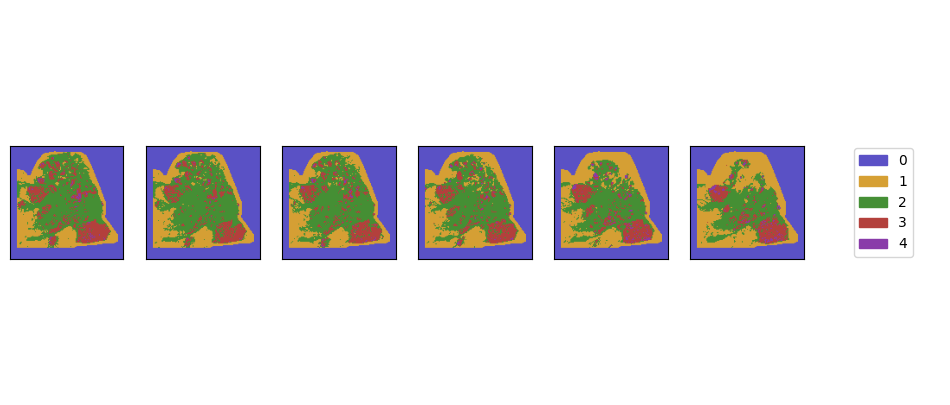

batch2_he 1


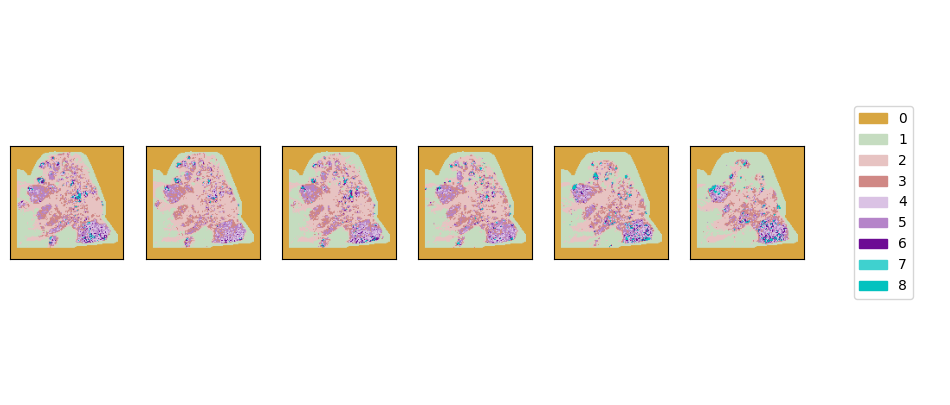

batch2_he 2


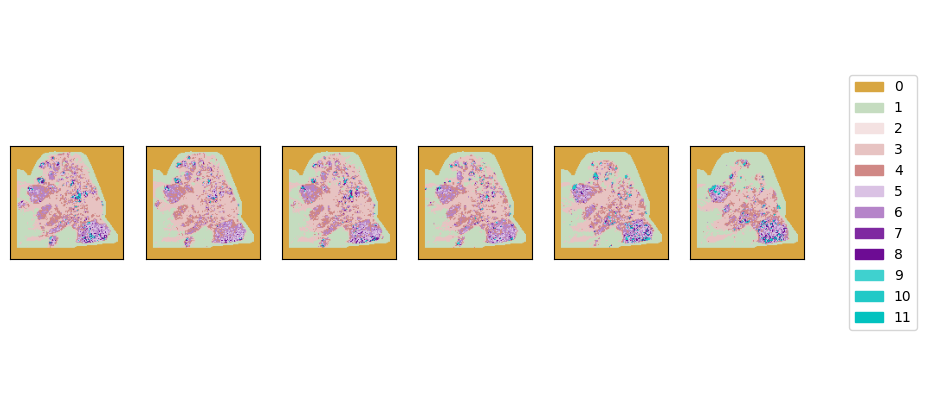

he 0


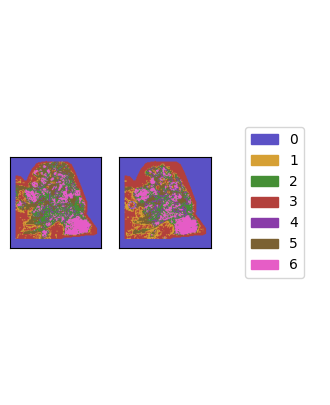

he 1


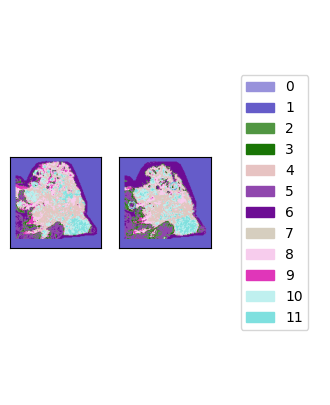

he 2


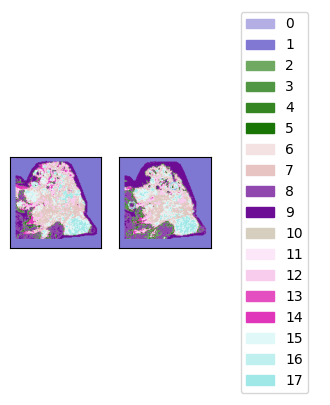

multiplex 0


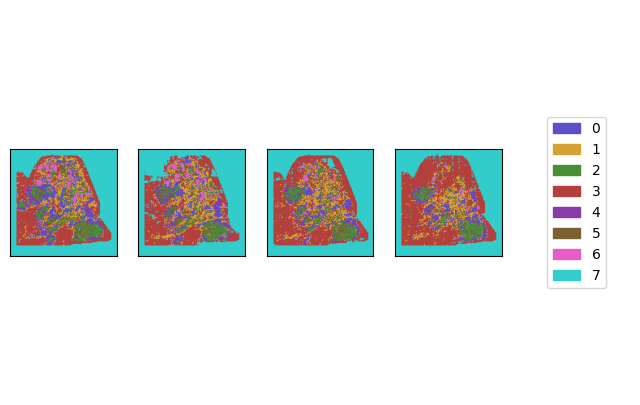

multiplex 1


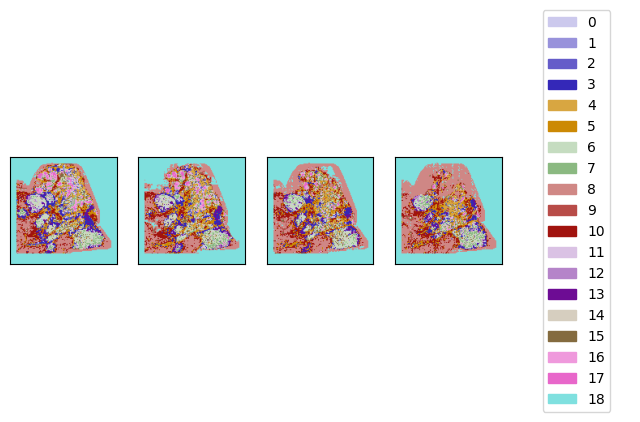

multiplex 2


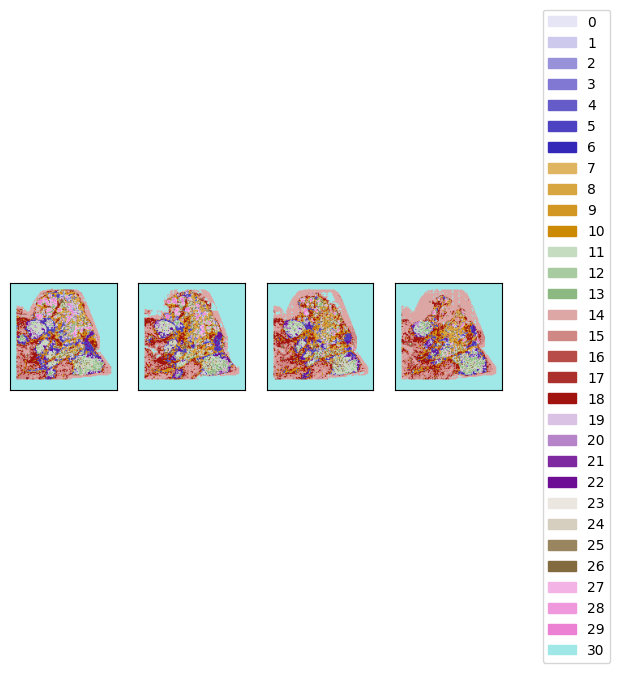

visium 0


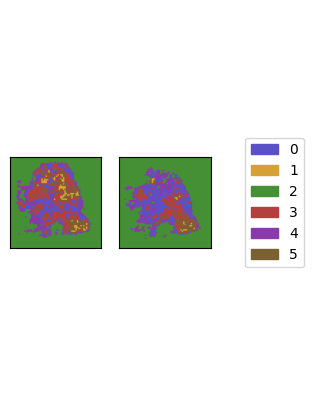

visium 1


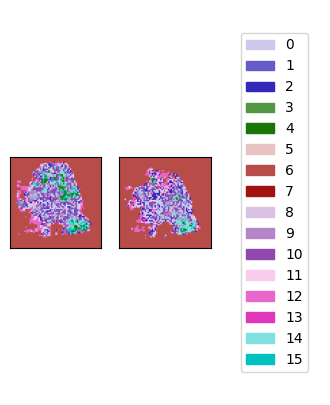

visium 2


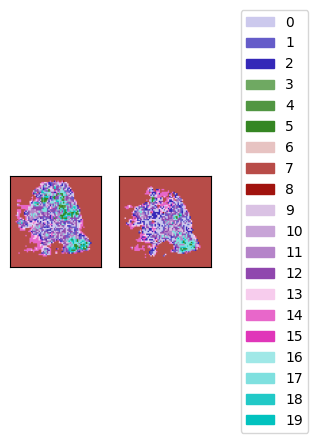

In [323]:
for dtype in mushroom.dtypes:
    for level in range(mushroom.num_levels):
        print(dtype, level)
        mushroom.display_clusters(dtype, level=level)
        plt.show()

In [324]:
out_dir = mushroom.trainer_kwargs['out_dir']

INFO:root:generating volume for batch2_he spore


0


INFO:root:generating volume for he spore
INFO:root:generating volume for multiplex spore
INFO:root:generating volume for visium spore
INFO:root:generating integrated volume
INFO:root:dtypes ['he'] have a weight of zero, excluding.
INFO:root:merging cluster volumes
INFO:root:constructing graph with 29241 edges
INFO:root:727 edges remaining after filtering
INFO:root:171 of 171 nodes processed
INFO:root:starting leiden clustering
INFO:root:finished integration, found 28 clusters


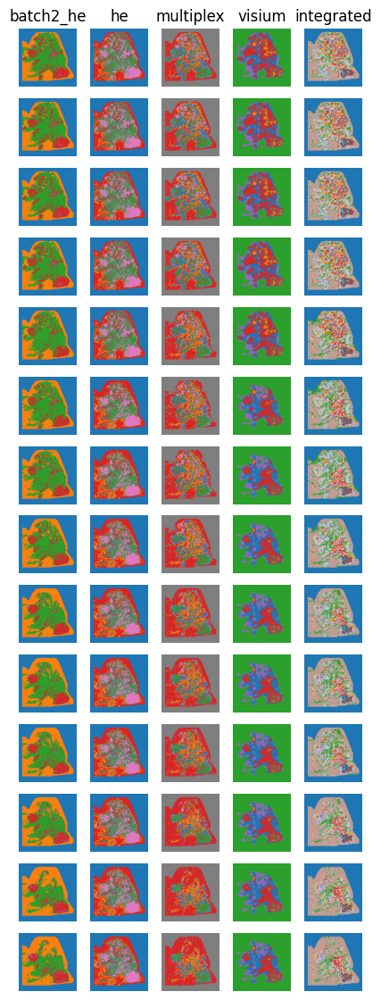

INFO:root:generating volume for batch2_he spore


1


INFO:root:generating volume for he spore
INFO:root:generating volume for multiplex spore
INFO:root:generating volume for visium spore
INFO:root:generating integrated volume
INFO:root:dtypes ['he'] have a weight of zero, excluding.
INFO:root:merging cluster volumes
INFO:root:constructing graph with 1674436 edges
INFO:root:17132 edges remaining after filtering
INFO:root:1294 of 1294 nodes processed
INFO:root:starting leiden clustering
INFO:root:finished integration, found 24 clusters


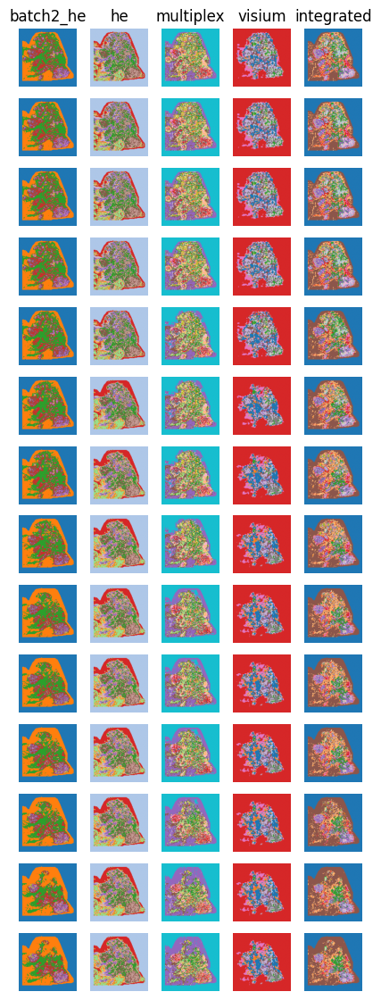

INFO:root:generating volume for batch2_he spore


2


INFO:root:generating volume for he spore
INFO:root:generating volume for multiplex spore
INFO:root:generating volume for visium spore
INFO:root:generating integrated volume
INFO:root:dtypes ['he'] have a weight of zero, excluding.
INFO:root:merging cluster volumes
INFO:root:constructing graph with 3671056 edges
INFO:root:27234 edges remaining after filtering
INFO:root:1916 of 1916 nodes processed
INFO:root:starting leiden clustering
INFO:root:finished integration, found 22 clusters


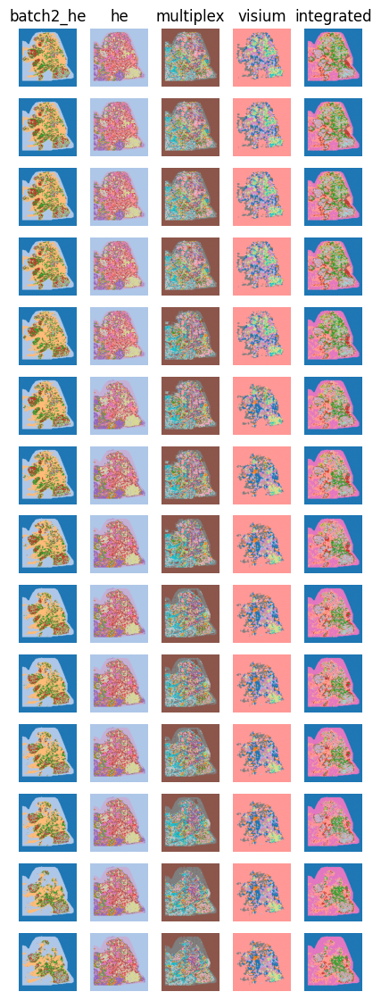

In [326]:
for level, cluster_res in enumerate(cluster_resolutions):
    print(level)
    dtype_to_volume = mushroom.generate_interpolated_volumes(
        z_scaler=z_scaler, level=level, integrate=True, dtype_to_weight=dtype_to_weights, resolution=cluster_res,
        dist_thresh=.2
    )
    dtype_to_volume_labels = {k:v.argmax(-1) if k != 'integrated' else v for k, v in dtype_to_volume.items()}

    mushroom.display_volumes(dtype_to_volume=dtype_to_volume_labels, positions=mushroom.section_positions)
    plt.show()

    pickle.dump({
        'probs': dtype_to_volume,
        'labeled': dtype_to_volume_labels
    }, open(os.path.join(out_dir, f'nbhd_volumes_l{level}.pkl'), 'wb'), protocol=4)

    del(dtype_to_volume)
    del(dtype_to_volume_labels)

In [327]:
clustering_params = {
    'z_scaler': z_scaler,
    'cluster_resolutions': cluster_resolutions,
    'dtype_to_weight': dtype_to_weights
}
yaml.safe_dump(clustering_params, open(os.path.join(out_dir, 'nbhd_volume_params.yaml'), 'w'))

In [328]:
mushroom.save()

INFO:root:saving config and outputs to /data/estorrs/mushroom/data/projects/subclone/HT397B1/mushroom_50res


In [352]:
mushroom = Mushroom.from_config(os.path.join(project_dir, 'HT397B1', 'mushroom_50res'))

INFO:root:loading spore for batch2_he
INFO:root:data mask detected
INFO:root:starting batch2_he processing
INFO:root:6 sections detected: ['HT397B1-U4', 'HT397B1-U8', 'HT397B1-U11', 'HT397B1-U16', 'HT397B1-U20', 'HT397B1-U28']
INFO:root:processing sections
INFO:root:generating image data for section HT397B1-U4


0.007287140063108625


INFO:root:generating image data for section HT397B1-U8
INFO:root:generating image data for section HT397B1-U11
INFO:root:generating image data for section HT397B1-U16
INFO:root:generating image data for section HT397B1-U20
INFO:root:generating image data for section HT397B1-U28
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 6 sections detected: [('HT397B1-U4', 'batch2_he'), ('HT397B1-U8', 'batch2_he'), ('HT397B1-U11', 'batch2_he'), ('HT397B1-U16', 'batch2_he'), ('HT397B1-U20', 'batch2_he'), ('HT397B1-U28', 'batch2_he')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
INFO:root:loading checkpoint: /data/estorrs/mushroom/data/projects/submission_v1/HT397B1/mushroom_50res/batch2_he_chkpts/last-v1.ckpt


batch2_he torch.Size([3, 135, 133])


INFO:root:loading spore for he
INFO:root:data mask detected
INFO:root:starting he processing
INFO:root:2 sections detected: ['HT397B1-U1', 'HT397B1-U21']
INFO:root:processing sections
INFO:root:generating image data for section HT397B1-U1


0.007287140063108625


INFO:root:generating image data for section HT397B1-U21
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 2 sections detected: [('HT397B1-U1', 'he'), ('HT397B1-U21', 'he')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
INFO:root:loading checkpoint: /data/estorrs/mushroom/data/projects/submission_v1/HT397B1/mushroom_50res/he_chkpts/last-v1.ckpt
INFO:root:loading spore for multiplex
INFO:root:data mask detected
INFO:root:starting multiplex processing
INFO:root:using 24 channels
INFO:root:4 sections detected: ['HT397B1-U2', 'HT397B1-U12', 'HT397B1-U22', 'HT397B1-U31']
INFO:root:processing sections
INFO:root:generating image data for section HT397B1-U2


he torch.Size([3, 135, 133])
0.007287140063108625


INFO:root:generating image data for section HT397B1-U12
INFO:root:generating image data for section HT397B1-U22
INFO:root:generating image data for section HT397B1-U31
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 4 sections detected: [('HT397B1-U2', 'multiplex'), ('HT397B1-U12', 'multiplex'), ('HT397B1-U22', 'multiplex'), ('HT397B1-U31', 'multiplex')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
INFO:root:loading checkpoint: /data/estorrs/mushroom/data/projects/submission_v1/HT397B1/mushroom_50res/multiplex_chkpts/last-v1.ckpt


multiplex torch.Size([24, 135, 133])


INFO:root:loading spore for visium
INFO:root:data mask detected
INFO:root:starting visium processing
INFO:root:using 9675 channels
INFO:root:2 sections detected: ['HT397B1-U1', 'HT397B1-U21']
INFO:root:processing sections


ppm 0.36435700315543124 target_ppm 100
tiling size 274


INFO:root:generating image data for section HT397B1-U1
INFO:root:generating image data for section HT397B1-U21
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 2 sections detected: [('HT397B1-U1', 'visium'), ('HT397B1-U21', 'visium')]


visium torch.Size([9675, 69, 68])


INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
INFO:root:loading checkpoint: /data/estorrs/mushroom/data/projects/submission_v1/HT397B1/mushroom_50res/visium_chkpts/last-v1.ckpt
INFO:root:chkpt files detected, embedding to spores
INFO:root:embedding batch2_he spore
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Predicting: |                                                                                                 …

INFO:root:embedding he spore
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Predicting: |                                                                                                 …

INFO:root:embedding multiplex spore
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Predicting: |                                                                                                 …

INFO:root:embedding visium spore
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Predicting: |                                                                                                 …

In [385]:
volume = pickle.load(
    open(os.path.join(mushroom.trainer_kwargs['out_dir'], f'nbhd_volumes_l2.pkl'), 'rb')
)['labeled']['integrated']
dtype_to_volume = pickle.load(
    open(os.path.join(mushroom.trainer_kwargs['out_dir'], f'nbhd_volumes_l2.pkl'), 'rb')
)['labeled']
# volume = pickle.load(
#     open(os.path.join(mushroom.trainer_kwargs['out_dir'], f'nbhd_volumes_l2.pkl'), 'rb')
# )['labeled']['visium']

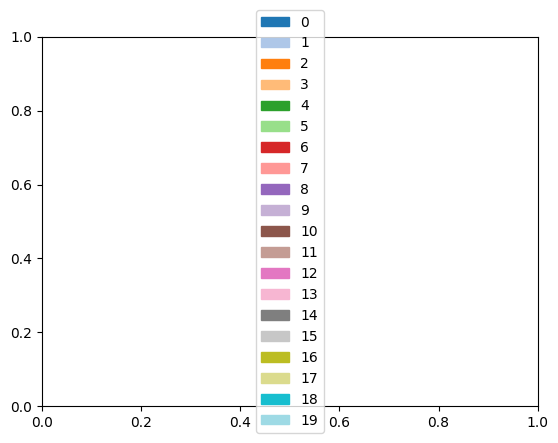

In [354]:
vis_utils.display_legend(np.unique(volume), vis_utils.get_cmap(len(np.unique(volume))))

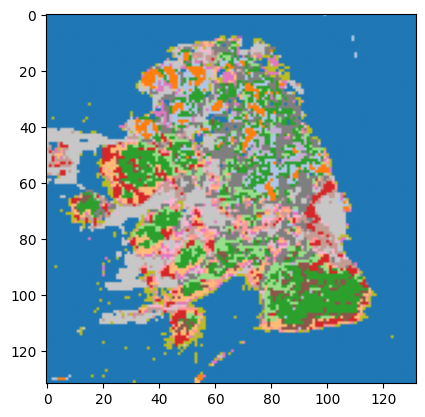

In [355]:
rgb = vis_utils.display_labeled_as_rgb(volume[0])
plt.imshow(rgb)

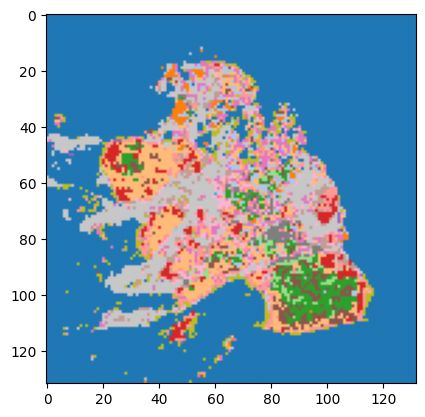

In [356]:
rgb = vis_utils.display_labeled_as_rgb(volume[20])
plt.imshow(rgb)

In [357]:
# !cat /data/estorrs/mushroom/data/projects/subclone/mushroom/HT397B1/config.yaml
!cat /data/estorrs/mushroom/data/projects/submission_v1/HT206B1/mushroom_50res/config.yaml

dtype_specific_params:
  he:
    trainer_kwargs:
      steps_per_epoch: 1000
  multiplex:
    trainer_kwargs:
      channel_mapping:
        AMACR: AMACR
        AMACR (D): AMACR
        AMACR (Dnew): AMACR
        AMACR (d): AMACR
        AMACR(D): AMACR
        AMACR(Dnew): AMACR
        AMACR(d): AMACR
        AMACR-(D): AMACR
        AMACR-(Dnew): AMACR
        AMACR-(d): AMACR
        AQP1: AQP1
        AQP1 (D): AQP1
        AQP1 (Dnew): AQP1
        AQP1 (d): AQP1
        AQP1(D): AQP1
        AQP1(Dnew): AQP1
        AQP1(d): AQP1
        AQP1-(D): AQP1
        AQP1-(Dnew): AQP1
        AQP1-(d): AQP1
        AQP2: AQP2
        AQP2 (D): AQP2
        AQP2 (Dnew): AQP2
        AQP2 (d): AQP2
        AQP2(D): AQP2
        AQP2(Dnew): AQP2
        AQP2(d): AQP2
        AQP2-(D): AQP2
        AQP2-(Dnew): AQP2
        AQP2-(d): AQP2
        AR: AR
        AR (D): AR
        AR (Dnew): AR
        AR (d): AR
        AR(D): AR
        AR(Dnew): AR
        AR(d): AR
        AR-(D): AR


In [358]:
config = yaml.safe_load(open('/data/estorrs/mushroom/data/projects/subclone/mushroom/HT397B1/config.yaml'))
sid_to_adata = {
    ('HT397B1-U1', 'visium'): sc.read_h5ad('/data/estorrs/mushroom/data/projects/subclone/registered/HT397B1/s0_visium_processed.h5ad'),
    ('HT397B1-U21', 'visium'): sc.read_h5ad('/data/estorrs/mushroom/data/projects/subclone/registered/HT397B1/s3_visium_processed.h5ad'),
}

In [359]:
for (sid, dtype), a in sid_to_adata.items():
    pts = a.obsm['spatial']
    labels = mushroom.assign_pts(pts, (sid, dtype), dtype, level=-1, volume=volume, use_volume=True)
    a.obs['nbhd'] = [f'nbhd {l}' for l in labels]
    a.obs['annotation'] = [sub if 'clone' in sub else nbhd
                           for sub, nbhd in zip(a.obs['subclone'], a.obs['nbhd'])]


In [360]:
# harmonize

In [361]:
a.obs

,in_tissue,array_row,array_col,FC1,FC2,FC3,FC4,FC5,FC6,Filtered tumor regions,...,Tumor boundary,Tumor regions,Tumor vs. TME,barcode,library_id,original,sample_id,subclone,nbhd,annotation
HT397B1-U21_AAACAGAGCGACTCCT-1,1,14,94,3.0,402.0,3.0,402.0,3.0,402.0,1.0,...,NaN,1.0,TME,AAACAGAGCGACTCCT-1,HT397B1-S1H3A1U21Bp1,0.739682,HT397B1-U21,clone_3,nbhd 10,clone_3
HT397B1-U21_AAACAGCTTTCAGAAG-1,1,43,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACAGCTTTCAGAAG-1,HT397B1-S1H3A1U21Bp1,0.756815,HT397B1-U21,,nbhd 10,nbhd 10
HT397B1-U21_AAACAGTGTTCCTGGG-1,1,73,43,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACAGTGTTCCTGGG-1,HT397B1-S1H3A1U21Bp1,0.747549,HT397B1-U21,,nbhd 16,nbhd 16
HT397B1-U21_AAACCGGGTAGGTACC-1,1,42,28,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACCGGGTAGGTACC-1,HT397B1-S1H3A1U21Bp1,0.770992,HT397B1-U21,,nbhd 13,nbhd 13
HT397B1-U21_AAACCGTTCGTCCAGG-1,1,52,42,2.0,232.0,2.0,232.0,2.0,232.0,2.0,...,NaN,2.0,TME,AAACCGTTCGTCCAGG-1,HT397B1-S1H3A1U21Bp1,0.871284,HT397B1-U21,clone_3,nbhd 3,clone_3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT397B1-U21_TTGTTCAGTGTGCTAC-1,1,24,64,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTTCAGTGTGCTAC-1,HT397B1-S1H3A1U21Bp1,0.745518,HT397B1-U21,,nbhd 10,nbhd 10
HT397B1-U21_TTGTTGTGTGTCAAGA-1,1,31,77,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTTGTGTGTCAAGA-1,HT397B1-S1H3A1U21Bp1,0.629916,HT397B1-U21,,nbhd 7,nbhd 7
HT397B1-U21_TTGTTTCACATCCAGG-1,1,58,42,1.0,232.0,1.0,232.0,1.0,232.0,2.0,...,Tumor boundary,2.0,TME,TTGTTTCACATCCAGG-1,HT397B1-S1H3A1U21Bp1,0.852332,HT397B1-U21,clone_3,nbhd 3,clone_3
HT397B1-U21_TTGTTTCATTAGTCTA-1,1,60,30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTTTCATTAGTCTA-1,HT397B1-S1H3A1U21Bp1,0.743960,HT397B1-U21,,nbhd 7,nbhd 7


... storing 'nbhd' as categorical
... storing 'annotation' as categorical


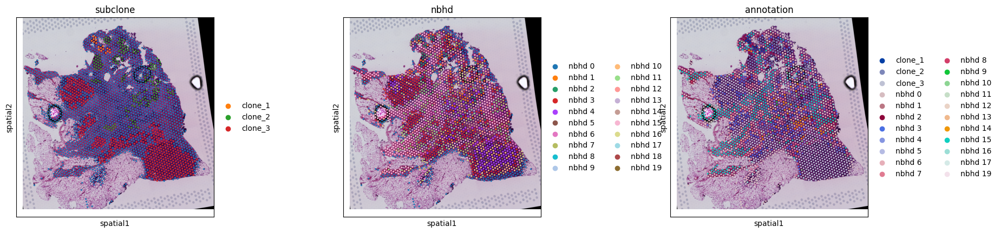

In [362]:
sc.pl.spatial(a, color=['subclone', 'nbhd', 'annotation'])

In [528]:
import anndata
combined = anndata.concat(sid_to_adata.values())
combined.obs

,in_tissue,array_row,array_col,FC1,FC2,FC3,FC4,FC5,FC6,Filtered tumor regions,...,Tumor boundary,Tumor regions,Tumor vs. TME,barcode,library_id,original,sample_id,subclone,nbhd,annotation
HT397B1-U1_AAACAAGTATCTCCCA-1,1,50,102,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACAAGTATCTCCCA-1,HT397B1-S1H3A1U1Bp1,0.732950,HT397B1-U1,,nbhd 4,nbhd 4
HT397B1-U1_AAACACCAATAACTGC-1,1,59,19,1.0,232.0,1.0,232.0,1.0,232.0,33.0,...,Tumor boundary,33.0,Tumor,AAACACCAATAACTGC-1,HT397B1-S1H3A1U1Bp1,0.905124,HT397B1-U1,clone_2,nbhd 15,clone_2
HT397B1-U1_AAACAGAGCGACTCCT-1,1,14,94,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACAGAGCGACTCCT-1,HT397B1-S1H3A1U1Bp1,0.759410,HT397B1-U1,,nbhd 4,nbhd 4
HT397B1-U1_AAACAGCTTTCAGAAG-1,1,43,9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACAGCTTTCAGAAG-1,HT397B1-S1H3A1U1Bp1,0.716851,HT397B1-U1,,nbhd 7,nbhd 7
HT397B1-U1_AAACAGGGTCTATATT-1,1,47,13,1.0,232.0,0.0,0.0,unknown,0.0,1.0,...,NaN,1.0,Tumor,AAACAGGGTCTATATT-1,HT397B1-S1H3A1U1Bp1,0.939888,HT397B1-U1,clone_1,nbhd 2,clone_1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT397B1-U21_TTGTTCAGTGTGCTAC-1,1,24,64,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTTCAGTGTGCTAC-1,HT397B1-S1H3A1U21Bp1,0.745518,HT397B1-U21,,nbhd 10,nbhd 10
HT397B1-U21_TTGTTGTGTGTCAAGA-1,1,31,77,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTTGTGTGTCAAGA-1,HT397B1-S1H3A1U21Bp1,0.629916,HT397B1-U21,,nbhd 7,nbhd 7
HT397B1-U21_TTGTTTCACATCCAGG-1,1,58,42,1.0,232.0,1.0,232.0,1.0,232.0,2.0,...,Tumor boundary,2.0,TME,TTGTTTCACATCCAGG-1,HT397B1-S1H3A1U21Bp1,0.852332,HT397B1-U21,clone_3,nbhd 3,clone_3
HT397B1-U21_TTGTTTCATTAGTCTA-1,1,60,30,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTTTCATTAGTCTA-1,HT397B1-S1H3A1U21Bp1,0.743960,HT397B1-U21,,nbhd 7,nbhd 7


In [529]:
exclude = [nbhd for nbhd, val in Counter(combined.obs['nbhd']).items() if val <= 10]

# clones = [x for x in sorted(set(combined.ubs['subclone'])) if x!='']
# tups = [(clone, nbhd) for clone, nbhd in zip(combined.obs['subclone'], combined.obs['nbhd'])]
counts = Counter([nbhd for clone, nbhd in zip(combined.obs['subclone'], combined.obs['nbhd']) if clone!=''])
total_counts = Counter(combined.obs['nbhd'])

for k, v in counts.items():
    frac = v / total_counts[k]
    print(k, frac)
    if frac > .5:
        exclude.append(k)
    
exclude.append('nbhd 0') # background

combined = combined[np.asarray([True if x not in exclude else False for x in combined.obs['nbhd']])]
combined

nbhd 15 0.097708082026538
nbhd 2 0.5072463768115942
nbhd 1 0.4262295081967213
nbhd 3 0.4152046783625731
nbhd 4 0.518361581920904
nbhd 5 0.32142857142857145
nbhd 14 0.2040358744394619
nbhd 10 0.6375545851528385
nbhd 13 0.22085889570552147
nbhd 16 0.17894736842105263
nbhd 12 0.2535211267605634
nbhd 9 0.3103448275862069
nbhd 7 0.19333333333333333
nbhd 0 0.1308980213089802
nbhd 6 0.23636363636363636
nbhd 11 0.10931174089068826
nbhd 8 0.3333333333333333
nbhd 18 1.0


View of AnnData object with n_obs × n_vars = 3758 × 17943
    obs: 'in_tissue', 'array_row', 'array_col', 'FC1', 'FC2', 'FC3', 'FC4', 'FC5', 'FC6', 'Filtered tumor regions', 'Filtered tumor regions auto', 'Filtered tumor vs. TME', 'Manual annotation', 'Morphologically processed purity', 'Purity', 'TME before boundary', 'TME boundary', 'Tumor before boundary', 'Tumor boundary', 'Tumor regions', 'Tumor vs. TME', 'barcode', 'library_id', 'original', 'sample_id', 'subclone', 'nbhd', 'annotation'
    obsm: 'spatial'

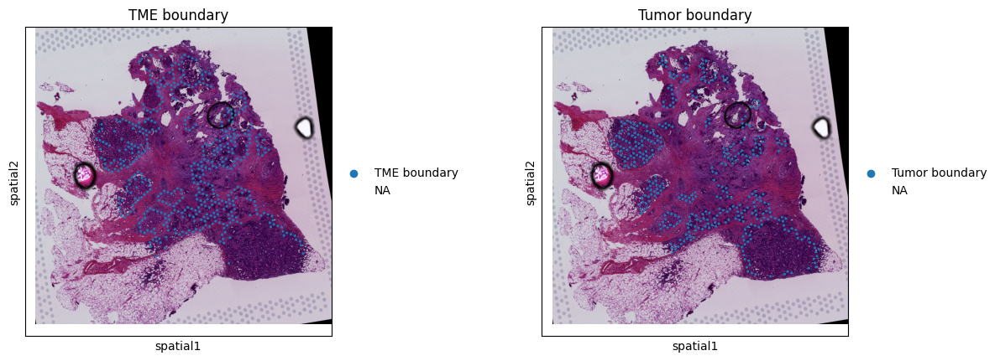

In [530]:
sc.pl.spatial(a, color=['TME boundary', 'Tumor boundary'])

In [531]:
boundary = combined[pd.isnull(combined.obs[['TME boundary', 'Tumor boundary']]).sum(1) < 2]
boundary

View of AnnData object with n_obs × n_vars = 1345 × 17943
    obs: 'in_tissue', 'array_row', 'array_col', 'FC1', 'FC2', 'FC3', 'FC4', 'FC5', 'FC6', 'Filtered tumor regions', 'Filtered tumor regions auto', 'Filtered tumor vs. TME', 'Manual annotation', 'Morphologically processed purity', 'Purity', 'TME before boundary', 'TME boundary', 'Tumor before boundary', 'Tumor boundary', 'Tumor regions', 'Tumor vs. TME', 'barcode', 'library_id', 'original', 'sample_id', 'subclone', 'nbhd', 'annotation'
    obsm: 'spatial'

In [532]:
# counts = Counter(boundary.obs['nbhd'])
# exclude = [k for k, v in counts.items() if v <= 10]
# exclude

         Falling back to preprocessing with `sc.pp.pca` and default params.


... storing 'barcode' as categorical
... storing 'annotation' as categorical
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


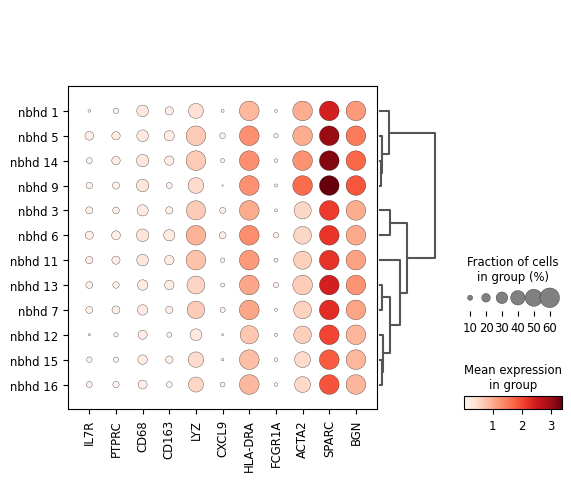

In [533]:
f = combined.copy()
f.obs['nbhd'] = f.obs['nbhd'].astype('category')
sc.tl.dendrogram(f, groupby='nbhd')
sc.pl.dotplot(
    f,
    groupby='nbhd', var_names=genes, dendrogram=True, dot_max=.6, log=True)
#     save='expression.pdf')

(1345, 17943)
         Falling back to preprocessing with `sc.pp.pca` and default params.


/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/tools/_utils.py:46: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm['X_pca'] = X
... storing 'barcode' as categorical
... storing 'annotation' as categorical
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


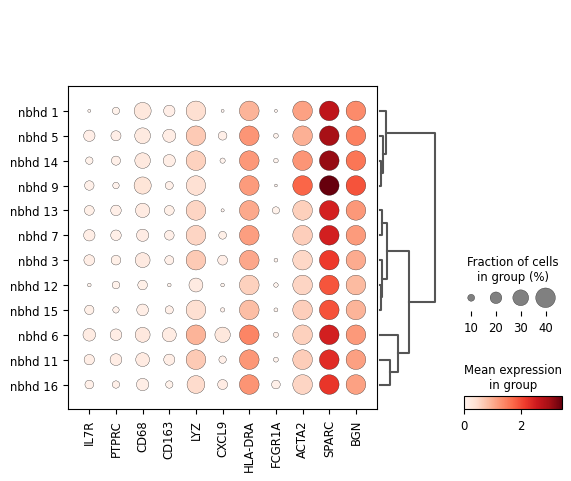

In [534]:
f = boundary.copy()
f.obs['nbhd'] = f.obs['nbhd'].astype('category')
# print(len([True if k in keep else False for k in f.obs['nbhd']]))
f = f[np.asarray([True if k not in exclude else False for k in f.obs['nbhd']])]
print(f.shape)
sc.tl.dendrogram(f, groupby='nbhd')
sc.pl.dotplot(
    f,
    groupby='nbhd', var_names=genes, dendrogram=True, dot_max=.4, log=True)
#     save='expression.pdf')

# sc.pl.dotplot(
#     f,
#     groupby='nbhd', var_names=genes, categories_order=order, dendrogram=False, dot_max=.6, log=True)

In [535]:
from collections import Counter

clone_to_counts = {}
data = []
order = [k for k in sorted(set(combined.obs['nbhd'])) if k not in exclude]
clones = [c for c in sorted(set(boundary.obs['subclone'])) if c]
for clone in clones:
    mask = boundary.obs['subclone']==clone
    n = np.count_nonzero(mask)
    cs = Counter(boundary.obs[mask]['nbhd'])
    d = {k:cs[k] / n for k in order}
    data.append([d.get(k, 0) for k in order])
df = pd.DataFrame(data, index=clones, columns=order).T
df.sort_values('clone_3')

,clone_1,clone_2,clone_3
nbhd 1,0.236842,0.180617,0.005848
nbhd 9,0.052632,0.039648,0.005848
nbhd 12,0.131579,0.070485,0.035088
nbhd 16,0.078947,0.017621,0.040936
nbhd 11,0.000000,0.035242,0.046784
nbhd 14,0.157895,0.220264,0.052632
nbhd 13,0.000000,0.052863,0.055556
nbhd 15,0.184211,0.140969,0.081871
nbhd 7,0.052632,0.030837,0.087719
nbhd 5,0.078947,0.101322,0.114035


In [536]:
bb = boundary[boundary.obs['Tumor boundary']=='Tumor boundary']
bb

View of AnnData object with n_obs × n_vars = 607 × 17943
    obs: 'in_tissue', 'array_row', 'array_col', 'FC1', 'FC2', 'FC3', 'FC4', 'FC5', 'FC6', 'Filtered tumor regions', 'Filtered tumor regions auto', 'Filtered tumor vs. TME', 'Manual annotation', 'Morphologically processed purity', 'Purity', 'TME before boundary', 'TME boundary', 'Tumor before boundary', 'Tumor boundary', 'Tumor regions', 'Tumor vs. TME', 'barcode', 'library_id', 'original', 'sample_id', 'subclone', 'nbhd', 'annotation'
    obsm: 'spatial'

In [608]:
from collections import Counter

clone_to_counts = {}
data = []
order = [k for k in sorted(set(bb.obs['nbhd'])) if k not in exclude]
clones = [c for c in sorted(set(bb.obs['subclone'])) if c]
total_counts = Counter(bb.obs['nbhd'])
for clone in clones:
    mask = bb.obs['subclone']==clone
    n = np.count_nonzero(mask)
    cs = Counter(bb.obs[mask]['nbhd'])
    d = {k:cs[k] / total_counts[k] for k in order}
    data.append([d.get(k, 0) for k in order])
df = pd.DataFrame(data, index=clones, columns=order).T
df.sort_values('clone_3', ascending=False)

,clone_1,clone_2,clone_3
nbhd 6,0.022727,0.090909,0.886364
nbhd 3,0.000000,0.145833,0.854167
nbhd 7,0.051282,0.179487,0.769231
nbhd 11,0.000000,0.333333,0.666667
nbhd 16,0.142857,0.190476,0.666667
nbhd 13,0.000000,0.387097,0.612903
nbhd 5,0.046154,0.353846,0.600000
nbhd 15,0.104478,0.477612,0.417910
nbhd 12,0.151515,0.484848,0.363636
nbhd 14,0.081081,0.675676,0.243243


In [612]:
source = df.copy()
source['nbhd'] = source.index.to_list()
source = source.melt(id_vars=['nbhd'])
source

,nbhd,variable,value
0,nbhd 1,clone_1,0.173077
1,nbhd 11,clone_1,0.000000
2,nbhd 12,clone_1,0.151515
3,nbhd 13,clone_1,0.000000
4,nbhd 14,clone_1,0.081081
5,nbhd 15,clone_1,0.104478
6,nbhd 16,clone_1,0.142857
7,nbhd 3,clone_1,0.000000
8,nbhd 5,clone_1,0.046154
9,nbhd 6,clone_1,0.022727


In [620]:
import altair as alt
nbhd_order = df.sort_values('clone_3', ascending=False).index.to_list()
alt.Chart(source).mark_bar().encode(
    x='sum(value)',
    y=alt.Y('nbhd', sort=nbhd_order),
    color='variable'
)

alt.Chart(...)

In [618]:
df.index.to_list()

['nbhd 1',
 'nbhd 11',
 'nbhd 12',
 'nbhd 13',
 'nbhd 14',
 'nbhd 15',
 'nbhd 16',
 'nbhd 3',
 'nbhd 5',
 'nbhd 6',
 'nbhd 7',
 'nbhd 9']

In [538]:
exclude

['nbhd 8',
 'nbhd 17',
 'nbhd 19',
 'nbhd 18',
 'nbhd 2',
 'nbhd 4',
 'nbhd 10',
 'nbhd 18',
 'nbhd 0']

In [539]:
# dtype_to_df = mushroom.calculate_cluster_intensities()

In [540]:
# f = combined.copy()
# f.obs['annotation'] = f.obs['annotation'].astype('category')
# sc.tl.dendrogram(f, groupby='annotation')
# sc.pl.dotplot(
#     f,
#     groupby='annotation', var_names=genes, dendrogram=True, dot_max=.6, log=True)
# #     save='expression.pdf')

In [568]:
def get_nbhd_rgb(labeled, nbhds, cmap=None):
    rgb = vis_utils.display_labeled_as_rgb(labeled, cmap=cmap)
    
    m = np.zeros_like(labeled, dtype=bool)
    for l in nbhds:
        m |= labeled==l
    
    rgb[~m] = 0.
    
    return rgb

# def get_intensity_img(case, dtype, gene):
#     dtype_to_true_pixels = pickle.load(
#         open(os.path.join(project_dir, case, 'mushroom_50res', 'true_pixels.pkl'), 'rb')
#     )
    
#     channels, true_pixels = dtype_to_true_pixels[dtype]['channels'], dtype_to_true_pixels[dtype]['true_pixels']
#     true_pixels = true_pixels[0]
    
#     img = true_pixels[..., channels.index(gene)]
    
#     return img


In [546]:
# # 18, 12, 9
# rgb = get_nbhd_rgb(volume[0], [6,3])
# plt.imshow(rgb)

In [547]:
# # 18, 12, 9
# rgb = get_nbhd_rgb(volume[0], [14,9,1])
# plt.imshow(rgb)

In [544]:
df.sort_values('clone_3', ascending=False)

,clone_1,clone_2,clone_3
nbhd 6,0.022727,0.090909,0.886364
nbhd 3,0.000000,0.145833,0.854167
nbhd 7,0.051282,0.179487,0.769231
nbhd 11,0.000000,0.333333,0.666667
nbhd 16,0.142857,0.190476,0.666667
nbhd 13,0.000000,0.387097,0.612903
nbhd 5,0.046154,0.353846,0.600000
nbhd 15,0.104478,0.477612,0.417910
nbhd 12,0.151515,0.484848,0.363636
nbhd 14,0.081081,0.675676,0.243243


In [545]:
n = df.shape[0] // 4 # quartiles
idc_group = df.sort_values('clone_3', ascending=False).index[:n].to_list()
dcis_group = df.sort_values('clone_3', ascending=False).index[-n:].to_list()
order = idc_group + dcis_group[::-1]
idc_group, dcis_group

(['nbhd 6', 'nbhd 3', 'nbhd 7'], ['nbhd 14', 'nbhd 9', 'nbhd 1'])

In [598]:
mapping = {
    6: (121, 171, 73),
    3: (36, 84, 181),
    7: (28, 135, 101),
    1: (143, 69, 196),
    9: (189, 40, 127),
    14: (201, 90, 42),
}
mapping.keys()

dict_keys([6, 3, 7, 1, 9, 14])

In [596]:
cmap = sns.color_palette('tab20')
for i in range(len(cmap)):
    if i in mapping:
        cmap[i] = np.asarray(mapping[i]) / 255.
cmap

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 array([0.56078431, 0.27058824, 0.76862745]),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 array([0.14117647, 0.32941176, 0.70980392]),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 array([0.4745098 , 0.67058824, 0.28627451]),
 array([0.10980392, 0.52941176, 0.39607843]),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 array([0.74117647, 0.15686275, 0.49803922]),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 array([0.78823529, 0.35294118, 0.16470588]),
 (0.7803921568627451, 0.7803921568627451, 0.7803921568627451),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.8588235294117647, 0.8588235294117647, 0.5529411764705883),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529),
 (0.6196078431372549, 0.8549019607843137, 0.8980392156862745)]

(-0.5, 131.5, 131.5, -0.5)

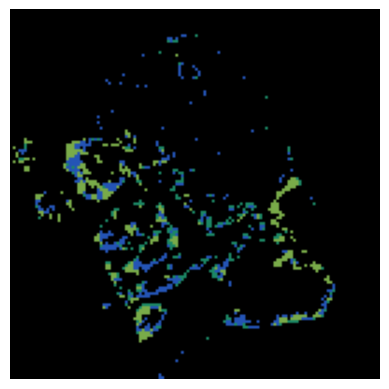

In [605]:

rgb = get_nbhd_rgb(volume[0], [int(x.split(' ')[-1]) for x in idc_group], cmap=cmap)
plt.imshow(rgb)
plt.axis('off')

(-0.5, 131.5, 131.5, -0.5)

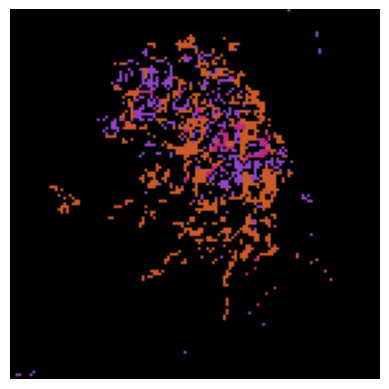

In [606]:

rgb = get_nbhd_rgb(volume[0], [int(x.split(' ')[-1]) for x in dcis_group], cmap=cmap)
plt.imshow(rgb)
plt.axis('off')

(-0.5, 131.5, 131.5, -0.5)

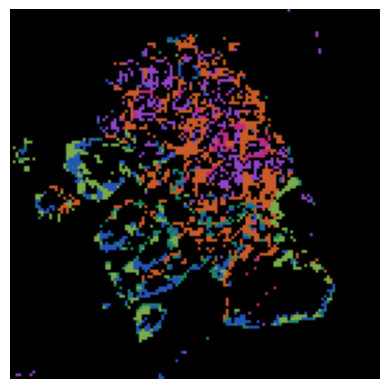

In [607]:

rgb = get_nbhd_rgb(volume[0], [int(x.split(' ')[-1]) for x in order], cmap=cmap)
plt.imshow(rgb)
plt.axis('off')

In [480]:
# genes = ['IL7R', 'PTPRC', 'CD68', 'CD163', 'LYZ', 'CXCL9', 'HLA-DRA', 'FCGR1A', 'ACTA2', 'SPARC', 'BGN']

In [525]:
# f = combined.copy()
# f.obs['nbhd'] = f.obs['nbhd'].astype('category')

# sc.pp.normalize_total(f)

# # order = dcis_group + idc_group
# # f = f[np.asarray([True if x in order else False for x in f.obs['nbhd']])]
# # sc.tl.dendrogram(f, groupby='nbhd')
# sc.pl.dotplot(
#     f,
#     groupby='nbhd', var_names=genes, dendrogram=False, dot_max=.6, log=False,)
# #     categories_order=order)
# #     save='expression.pdf')

In [526]:
# f = combined.copy()
# f.obs['nbhd'] = f.obs['nbhd'].astype('category')

# order = dcis_group + idc_group
# f = f[np.asarray([True if x in order else False for x in f.obs['nbhd']])]
# # sc.tl.dendrogram(f, groupby='nbhd')
# sc.pl.dotplot(
#     f,
#     groupby='nbhd', var_names=genes, dendrogram=False, dot_max=.6, log=True,
#     categories_order=order)
# #     save='expression.pdf')

In [562]:
dtype_to_df = mushroom.calculate_cluster_intensities(
    projection_dtype='integrated', dtype_to_volume=dtype_to_volume)
dtype_to_df.keys()

dict_keys(['batch2_he', 'he', 'multiplex', 'visium'])

In [563]:
idxs = [int(x.replace('nbhd ', '')) for x in order]
dtype_to_df['visium'].loc[idxs, genes]

,IL7R,PTPRC,CD68,CD163,LYZ,CXCL9,HLA-DRA,FCGR1A,ACTA2,SPARC,BGN
6,0.447940,0.470477,0.563094,0.530740,0.714383,0.297835,0.801892,0.328871,0.643391,0.843583,0.784798
3,0.464576,0.454532,0.609501,0.540891,0.739906,0.325886,0.814094,0.358456,0.578374,0.858730,0.796505
7,0.346147,0.329885,0.439744,0.413671,0.548410,0.221737,0.586526,0.254407,0.392273,0.615617,0.566142
1,0.448540,0.658602,0.943998,0.672066,0.899535,0.442028,1.196101,0.472558,1.320732,1.304285,1.250541
9,0.470995,0.919151,1.400202,0.928078,1.164932,0.544298,1.691749,0.623476,2.191326,1.881854,1.832202
14,0.802120,0.929471,1.057280,0.935819,1.288716,0.595844,1.557078,0.614357,1.451686,1.632100,1.544317


In [564]:
idxs = [int(x.replace('nbhd ', '')) for x in order]
dtype_to_df['multiplex'].loc[idxs][['CD31', 'CD45', 'CD8', 'HLA-DR', 'SMA', 'Podoplanin']]

,CD31,CD45,CD8,HLA-DR,SMA,Podoplanin
6,2.631201,3.179991,3.336737,3.512968,0.704711,1.516361
3,0.669279,1.286244,0.201127,0.590275,0.518778,0.058489
7,0.946235,0.864258,0.554407,0.824153,0.662427,0.098964
1,0.609731,1.317611,-0.318098,0.310109,0.877554,0.664092
9,0.619684,0.284323,0.138938,0.433737,0.669943,0.259190
14,0.631635,0.286826,0.193012,0.456243,0.587339,0.163205


In [553]:
fps = sorted(utils.listfiles('/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/'))
fps

['/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U12.txt',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U2.txt',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U22.txt',
 '/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U31.txt']

In [554]:
for fp in fps:
    df = pd.read_csv(fp, sep='\t')
    labels = set(df['cell_type'])
    print(fp, labels)

/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U12.txt {'Endothelial', 'Fibroblast', 'Immune', 'Epithelial', 'Unlabeled'}
/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U2.txt {'Endothelial', 'Fibroblast', 'Immune', 'Epithelial', 'Unlabeled'}
/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U22.txt {'CD8 T cell', 'Endothelial', 'Dendritic', 'Fibroblast', 'Immune', 'Epithelial', 'T cell', 'Treg', 'Unlabeled'}
/data/estorrs/mushroom/data/projects/submission_v1/HT397B1/auxiliary/multiplex/HT397B1-U31.txt {'CD8 T cell', 'Endothelial', 'Fibroblast', 'Immune', 'Epithelial', 'T cell', 'Treg', 'Unlabeled'}


In [555]:
case_to_feat_df = {}
for fp in fps:
    case = fp.split('/')[-1].replace('.txt', '')
    df = pd.read_csv(fp, sep='\t')
    df['case'] = case
    df = df[['row', 'col', 'case', 'cell_type']]

    labels = set(df['cell_type'])
    if 'T cell' in labels: # make sure we only do the t cell ones
        case_to_feat_df[case] = df
case_to_feat_df.keys()

dict_keys(['HT397B1-U22', 'HT397B1-U31'])

In [556]:
for case, df in case_to_feat_df.items():
    pts = df[['col', 'row']].values
    labels = mushroom.assign_pts(pts, (case, 'multiplex'), 'integrated', use_volume=True, volume=volume)
    df['nbhd'] = [f'nbhd {x}' for x in labels]
next(iter(case_to_feat_df.values()))

,row,col,case,cell_type,nbhd
0,116,4495,HT397B1-U22,Unlabeled,nbhd 0
1,148,4061,HT397B1-U22,Unlabeled,nbhd 0
2,133,4286,HT397B1-U22,Unlabeled,nbhd 0
3,748,8711,HT397B1-U22,Unlabeled,nbhd 0
4,865,6667,HT397B1-U22,Unlabeled,nbhd 0
...,...,...,...,...,...
154091,18620,7012,HT397B1-U22,Epithelial,nbhd 16
154092,18619,7061,HT397B1-U22,Epithelial,nbhd 16
154093,18632,7025,HT397B1-U22,Epithelial,nbhd 16
154094,17989,14840,HT397B1-U22,Unlabeled,nbhd 0


In [557]:
# sns.scatterplot(case_to_feat_df['HT397B1-U22'], x='col', y='row', hue='nbhd', s=.1)
# plt.gca().invert_yaxis()
# plt.axis('equal')

(-901.7, 18935.7, 19565.15, -810.1500000000001)

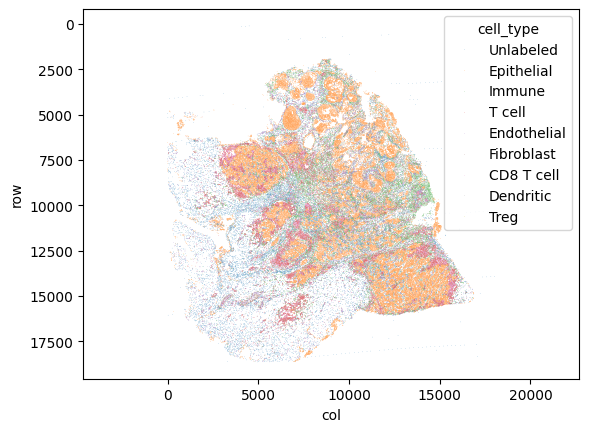

In [558]:
sns.scatterplot(case_to_feat_df['HT397B1-U22'], x='col', y='row', hue='cell_type', s=.1)
plt.gca().invert_yaxis()
plt.axis('equal')

In [565]:
show = ['CD8 T cell', 'T cell', 'Treg', 'Fibroblast']

In [559]:
df = pd.concat(case_to_feat_df.values(), axis=0)

nbhds = sorted(set(df['nbhd']))
cts = sorted(set(df['cell_type']))
data = []
for nbhd in nbhds:
    f = df[df['nbhd']==nbhd]
    counts = Counter(f['cell_type'])
    data.append([counts.get(ct, 0) for ct in cts])
count_df = pd.DataFrame(data=data, columns=cts, index=nbhds)
count_df

,CD8 T cell,Dendritic,Endothelial,Epithelial,Fibroblast,Immune,T cell,Treg,Unlabeled
nbhd 0,1771,42,5214,12859,2375,4328,7453,37,17229
nbhd 1,191,5,511,3381,724,905,600,15,475
nbhd 10,847,5,664,11098,357,1345,2477,28,704
nbhd 11,829,10,928,2025,483,2444,2871,18,1958
nbhd 12,347,5,737,4903,1257,1475,1287,18,1055
nbhd 13,732,10,803,3659,756,2144,2532,28,1234
nbhd 14,365,7,615,3025,1149,1517,1326,22,834
nbhd 15,1861,42,3106,9045,2179,7221,7488,93,7488
nbhd 16,1033,6,1150,4882,1104,2014,3306,24,2546
nbhd 17,6,0,9,69,23,25,15,1,9


In [560]:
count_df.loc[order]

,CD8 T cell,Dendritic,Endothelial,Epithelial,Fibroblast,Immune,T cell,Treg,Unlabeled
nbhd 6,1334,12,773,4088,180,1884,3934,30,1219
nbhd 3,2854,28,1619,16803,1111,3768,7693,103,2061
nbhd 7,1792,21,1229,6857,820,3327,5294,57,1825
nbhd 1,191,5,511,3381,724,905,600,15,475
nbhd 9,16,0,58,145,109,91,66,1,40
nbhd 14,365,7,615,3025,1149,1517,1326,22,834


In [566]:
frac_df = count_df / np.expand_dims(count_df.values.sum(1), -1)
frac_df.loc[order, show]

,CD8 T cell,T cell,Treg,Fibroblast
nbhd 6,0.099153,0.292404,0.002230,0.013379
nbhd 3,0.079190,0.213457,0.002858,0.030827
nbhd 7,0.084441,0.249458,0.002686,0.038639
nbhd 1,0.028059,0.088145,0.002204,0.106361
nbhd 9,0.030418,0.125475,0.001901,0.207224
nbhd 14,0.041196,0.149661,0.002483,0.129684


In [567]:
frac_df = count_df / np.expand_dims(count_df.values.sum(1), -1)
frac_df.loc[order,]

,CD8 T cell,Dendritic,Endothelial,Epithelial,Fibroblast,Immune,T cell,Treg,Unlabeled
nbhd 6,0.099153,0.000892,0.057455,0.303850,0.013379,0.140033,0.292404,0.002230,0.090605
nbhd 3,0.079190,0.000777,0.044922,0.466232,0.030827,0.104550,0.213457,0.002858,0.057186
nbhd 7,0.084441,0.000990,0.057912,0.323108,0.038639,0.156771,0.249458,0.002686,0.085996
nbhd 1,0.028059,0.000735,0.075070,0.496695,0.106361,0.132951,0.088145,0.002204,0.069781
nbhd 9,0.030418,0.000000,0.110266,0.275665,0.207224,0.173004,0.125475,0.001901,0.076046
nbhd 14,0.041196,0.000790,0.069413,0.341422,0.129684,0.171219,0.149661,0.002483,0.094131


In [624]:
frac_df.loc[nbhd_order, ['CD8 T cell', 'T cell', 'Fibroblast']] # t cell and fibroblast only

,CD8 T cell,T cell,Fibroblast
nbhd 6,0.099153,0.292404,0.013379
nbhd 3,0.079190,0.213457,0.030827
nbhd 7,0.084441,0.249458,0.038639
nbhd 11,0.071676,0.248228,0.041760
nbhd 16,0.064301,0.205789,0.068721
nbhd 13,0.061523,0.212809,0.063540
nbhd 5,0.055066,0.169838,0.065120
nbhd 15,0.048309,0.194377,0.056564
nbhd 12,0.031306,0.116113,0.113407
nbhd 14,0.041196,0.149661,0.129684


In [629]:
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
plt.rcParams['svg.fonttype'] = 'none'

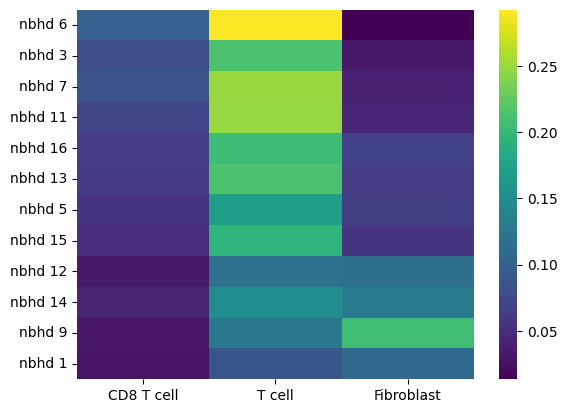

In [630]:
sns.heatmap(
    frac_df.loc[nbhd_order, ['CD8 T cell', 'T cell', 'Fibroblast']], cmap='viridis'
)
plt.savefig('/data/estorrs/sandbox/subclone_ht397B1_ct_fractions.svg')

In [625]:
import seaborn as sns

# HT268

In [652]:
case = 'HT268B1'
z_scaler = .2
cluster_resolutions = [1., 1., 1.]
target_res = 50
visium_target_res = 100

In [653]:
# fix issues where antibody names aren't consistent accross some images
channel_to_idents = {
    'Pan-Cytokeratin': ['Pan-Cytokeratin', 'Pan-CK', 'PanCK', 'PanCytokeratin'],
    'E-cadherin': ['E-cadherin', 'E-Cadherin'],
    'CD45': ['CD45'],
    'CD45RO': ['CD45RO'],
    'CD45RA': ['CD45RA'],
    'CD8': ['CD8', 'CD8a'],
    'DAPI': ['DAPI'],
    'CD4': ['CD4'],
    'CD3e': ['CD3e', 'CD3'],
    'Vimentin': ['Vimentin', 'Vim', 'VIM'],
    'SMA': ['SMA', 'a-SMA'],
    'CD31': ['CD31'],
    'CD20': ['CD20', 'CD20-Akoya'],
    'CD68': ['CD68'],
    'CD163': ['CD163'],
    'FOXP3': ['FoxP3', 'FOXP3', 'Foxp3'],
    'cKit': ['cKit', 'cKIT', 'ckit-(D)', 'ckit'],
    'MGP': ['MGP'],
    'CD36': ['CD36'],
    'PR': ['PR'],
    'ER': ['ER'],
    'P21': ['P21'],
    'P16': ['P16'],
    'CK5': ['Keratin 5', 'KRT5', 'CK5'],
    'CK7': ['CK7'],
    'CK8/18': ['CK8/18'],
    'TFF1': ['TFF1'],
    'beta-integrin': ['beta-integrin', 'beta3-integrin'],
    'CK14': ['CK14', 'Keratin 14', 'KRT14'],
    'CK17': ['CK17', 'Keratin 17', 'CK17'],
    'CK19': ['CK19', 'Keratin 19', 'KRT19'],
    'CD11b': ['CD11b', 'CD11B', 'cd11b'],
    'GATA3': ['GATA3'],
    'PLAT/tPA': ['PLAT/tPA', 'PLAT'],
    'COX6c': ['COX6c', 'COX6C (D)', 'COX6C'],
    'Her2': ['Her2', 'HER2'],
    'Bap1': ['Bap1', 'BAP1'],
    'GLUT1': ['Glut1', 'GLUT1'],
    'CD11c': ['CD11c'],
    'HLA-DR': ['HLA-DR', 'HLADR'],
    'Ki67': ['Ki67', 'KI67'],
    'Podoplanin': ['Podoplanin', 'PDPN'],
    'CTLA4': ['CTLA4'],
    'SLC39A6': ['SLC39A6'],
    'BCA1': ['BCA1'],
    'BCAL': ['BCAL'],
    'TUBB3': ['TUBB3'],
    'PTPRZ1': ['PTPRZ1'],
    'HIF1A': ['HIF1a', 'HIF1A'],
    'PAI1': ['PAI1'],
    'GFAP': ['GFAP'],
    'VEGFA': ['VEGFA'],
    'IBA1': ['IBA1'],
    'OLIG2': ['OLIG2'],
    'FN1': ['FN1'],
    'a-Amylase': ['a-Amylase', 'Amylase (D', 'Amylase'],
    'Hep-Par-1': ['Hep-Par-1', 'HepPar1-(D)', 'HepPar1'],
    'Granzyme-B': ['Granzyme B', 'GZMB'],
    'TCF-1': ['TCF-1'],
    'CD39': ['CD39'],
    'PD1': ['PD-1', 'PD1'],
    'PDL1': ['PD-L1', 'PDL1'],
    'Histone-H3-Pho': ['Histone H3 Pho'],
    'Maspin': ['Maspin'],
    'MMP9': ['MMP9'],
    'CD44': ['CD44'],
    'CD107A': ['CD107a'],
    'FGFR3': ['FGFR3'],
    'CD138': ['CD138'],
    'MLPH': ['MLPH'],
    'P63': ['P63', 'p63'],
    'GP2': ['GP2'],
    'COX2': ['COX2'],
    'Lyve-1': ['Lyve-1', 'LYVE1'],
    'CCL2': ['CCL2'],
    'MUC2': ['MUC2'],
    'SOX9': ['SOX9'],
    'STEAP4': ['STEAP4'],
    'AR': ['AR'],
    'AMACR': ['AMACR'],
    'PGC': ['PGC', 'PGC (D)'],
    'CFTR': ['CFTR (D)', 'CFTR'],
    'REG3A': ['REG3A (D)', 'REG3A'],
    'LAMC2': ['LAMC2 (D)', 'LAMC2'],
    'INS': ['INS (D)', 'INS'],
    'CRP': ['CRP (D)', 'CRP'],
    'CD74': ['CD74 (D)', 'CD74'],
    'MUC5AC': ['MUC5AC (D)', 'MUC5AC'],
    'AQP1': ['AQP1'],
    'AQP2': ['Aqp2', 'AQP2'], 
    'LRP2': ['LRP2'],
    'UMOD': ['UMOD'],
    'CALB1': ['CALB1'],
    'CP': ['CP'],
    'CA9': ['CA9'],
    'UCHL1': ['UCHL1'],
}
channel_mapping = {v:k for k, vs in channel_to_idents.items() for v in vs}

# add in (D) variants
variants = ['(D)', ' (D)', '(d)', ' (d)', '-(D)', '-(d)', ' (Dnew)', '(Dnew)', '-(Dnew)']
channel_mapping.update({k + variant:v
                      for k, v in channel_mapping.items()
                      for variant in variants})

In [646]:
dtype_to_weights = {
    'he': 1.,
    'visium': 1.,
}

In [654]:
metadata = yaml.safe_load(open(os.path.join(run_dir, case, 'registered', 'metadata.yaml')))

config = deepcopy(DEFAULT_CONFIG)

mask_fp = os.path.join(run_dir, case, 'masks', 'tissue_mask.tif')
if not os.path.exists(mask_fp):
    mask_fp = None
# mask_fp = None # running without masks

config = utils.recursive_update(config, {
    'sections': metadata['sections'],
    'trainer_kwargs': {
        'input_resolution': metadata['resolution'],
        'target_resolution': target_res,
        'out_dir': os.path.join('/data/estorrs/mushroom/data/projects/subclone', case, f'mushroom_{target_res}res'),
        'accelerator': 'gpu',
        'steps_per_epoch': 1000,
        'data_mask': mask_fp,
    }
})

config['dtype_specific_params'] = utils.recursive_update(config['dtype_specific_params'], {
    'visium': {
        'trainer_kwargs': {
            'target_resolution': visium_target_res  # lower resolution for visium
        }
    },
    'multiplex': {
        'trainer_kwargs': {
            'channel_mapping': channel_mapping
        }
    }
})

config = alter_filesystem(config, source_root, target_root)
config

{'sections': [{'data': [{'dtype': 'visium',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT268B1/registered/s0_HT268B1-U2_visium.h5ad'},
    {'dtype': 'he',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT268B1/registered/s0_HT268B1-U2_he.tif'}],
   'position': 5,
   'sid': 'HT268B1-U2'},
  {'data': [{'dtype': 'visium',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT268B1/registered/s1_HT268B1-U12_visium.h5ad'},
    {'dtype': 'he',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT268B1/registered/s1_HT268B1-U12_he.tif'}],
   'position': 55,
   'sid': 'HT268B1-U12'},
  {'data': [{'dtype': 'visium',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT268B1/registered/s2_HT268B1-U22_visium.h5ad'},
    {'dtype': 'he',
     'filepath': '/data/estorrs/mushroom/data/projects/submission_v1/HT268B1/registered/s2_HT268B1-U22_he.tif'}],
   'position': 105,
   'sid': 'HT268B1-U22'},
  {'

In [655]:
mushroom = Mushroom.from_config(config)

INFO:root:loading spore for he
INFO:root:data mask detected
INFO:root:starting he processing
INFO:root:4 sections detected: ['HT268B1-U2', 'HT268B1-U12', 'HT268B1-U22', 'HT268B1-U32']
INFO:root:processing sections
INFO:root:generating image data for section HT268B1-U2


0.007004457303449433


INFO:root:generating image data for section HT268B1-U12
INFO:root:generating image data for section HT268B1-U22
INFO:root:generating image data for section HT268B1-U32


he torch.Size([3, 135, 133])


INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 4 sections detected: [('HT268B1-U2', 'he'), ('HT268B1-U12', 'he'), ('HT268B1-U22', 'he'), ('HT268B1-U32', 'he')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
INFO:root:loading spore for visium
INFO:root:data mask detected
INFO:root:starting visium processing
INFO:root:using 11051 channels
INFO:root:4 sections detected: ['HT268B1-U2', 'HT268B1-U12', 'HT268B1-U22', 'HT268B1-U32']
INFO:root:processing sections


ppm 0.35022286517247164 target_ppm 100
tiling size 285


INFO:root:generating image data for section HT268B1-U2
INFO:root:generating image data for section HT268B1-U12
INFO:root:generating image data for section HT268B1-U22
INFO:root:generating image data for section HT268B1-U32


visium torch.Size([11051, 68, 68])


INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:total of 4 sections detected: [('HT268B1-U2', 'visium'), ('HT268B1-U12', 'visium'), ('HT268B1-U22', 'visium'), ('HT268B1-U32', 'visium')]
INFO:root:creating data loaders
INFO:root:creating ViT
INFO:root:model initialized
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


In [656]:
mushroom.train()
mushroom.embed_sections()

INFO:root:starting training for he
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:639: Checkpoint directory /data/estorrs/mushroom/data/projects/subclone/HT268B1/mushroom_50res/he_chkpts exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type | Params
------------------------------
0 | sae  | SAE  | 5.0 M 
------------------------------
5.0 M     Trainable params
0         Non-trainable params
5.0 M     Total params
19.869    Total estimated model params size (MB)
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Training: |                                                                                                   …

`Trainer.fit` stopped: `max_epochs=1` reached.
INFO:root:finished training he, saved chkpt to /data/estorrs/mushroom/data/projects/subclone/HT268B1/mushroom_50res/he_chkpts/last-v1.ckpt
INFO:root:starting training for visium
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:639: Checkpoint directory /data/estorrs/mushroom/data/projects/subclone/HT268B1/mushroom_50res/visium_chkpts exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]

  | Name | Type | Params
------------------------------
0 | sae  | SAE  | 30.2 M
------------------------------
30.2 M    Trainable params
0         Non-trainable params
30.2 M    Total params
120.692   Total estimated model params size (MB)


Training: |                                                                                                   …

`Trainer.fit` stopped: `max_epochs=1` reached.
INFO:root:finished training visium, saved chkpt to /data/estorrs/mushroom/data/projects/subclone/HT268B1/mushroom_50res/visium_chkpts/last-v1.ckpt
INFO:root:embedding he spore
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:441: The 'predict_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=63` in the `DataLoader` to improve performance.


Predicting: |                                                                                                 …

INFO:root:embedding visium spore
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2,3]


Predicting: |                                                                                                 …

he 0


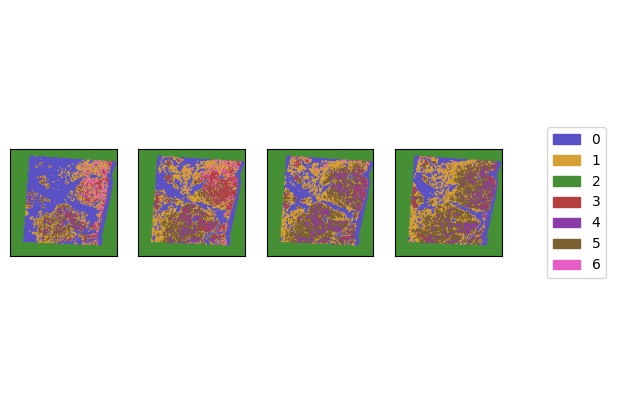

he 1


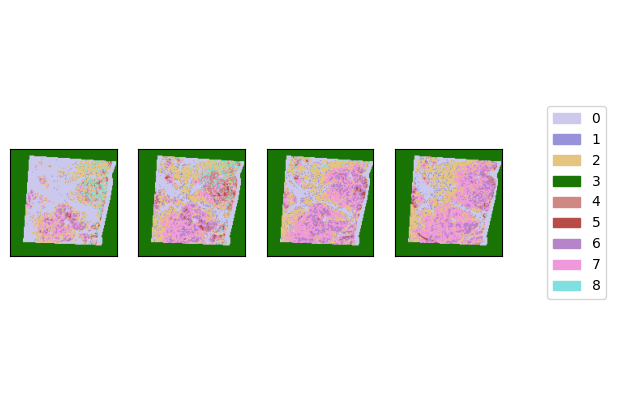

he 2


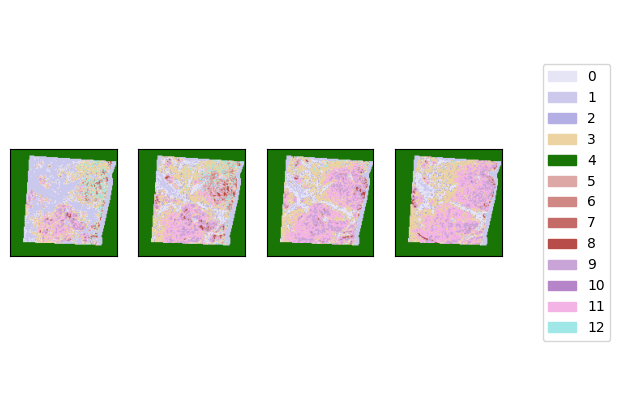

visium 0


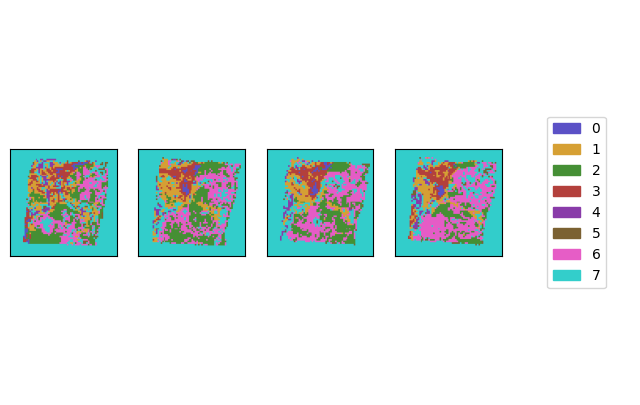

visium 1


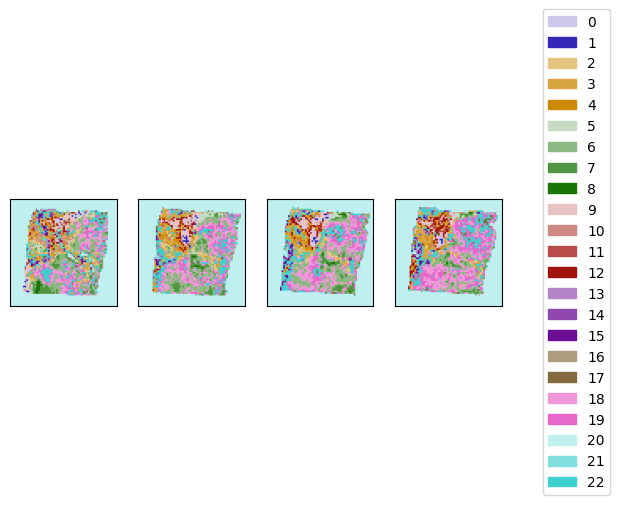

visium 2


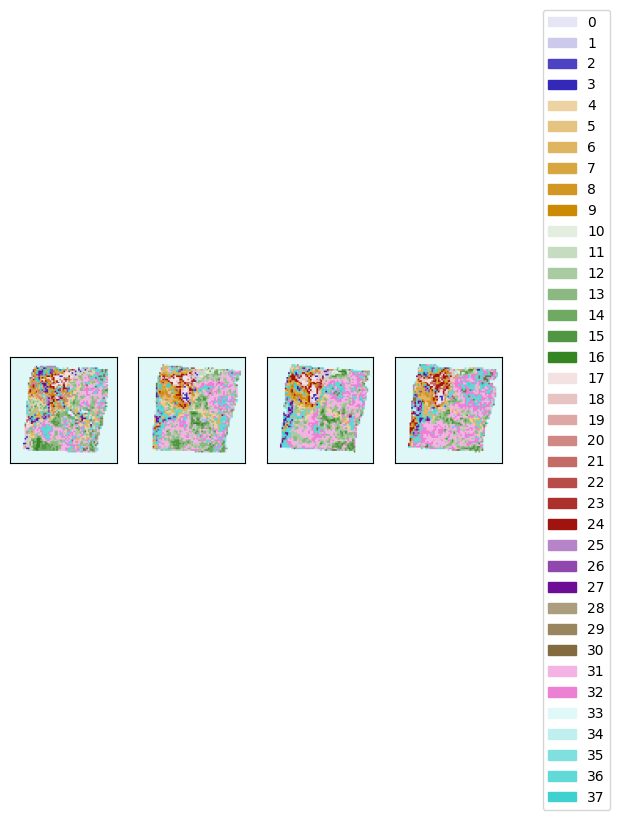

In [657]:
for dtype in mushroom.dtypes:
    for level in range(mushroom.num_levels):
        print(dtype, level)
        mushroom.display_clusters(dtype, level=level)
        plt.show()

In [659]:
out_dir = mushroom.trainer_kwargs['out_dir']

INFO:root:generating volume for he spore
INFO:root:generating volume for visium spore


0


INFO:root:generating integrated volume
INFO:root:merging cluster volumes
INFO:root:constructing graph with 2809 edges
INFO:root:145 edges remaining after filtering
INFO:root:53 of 53 nodes processed
INFO:root:starting leiden clustering
INFO:root:finished integration, found 19 clusters


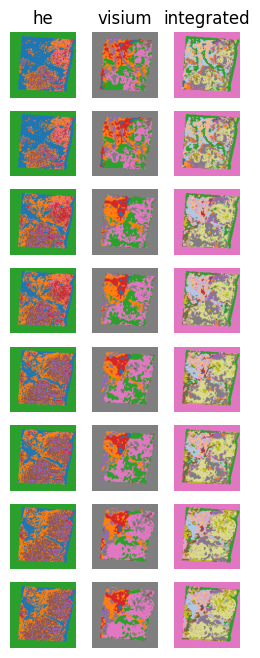

INFO:root:generating volume for he spore
INFO:root:generating volume for visium spore


1


INFO:root:generating integrated volume
INFO:root:merging cluster volumes
INFO:root:constructing graph with 33489 edges
INFO:root:797 edges remaining after filtering
INFO:root:183 of 183 nodes processed
INFO:root:starting leiden clustering
INFO:root:finished integration, found 46 clusters


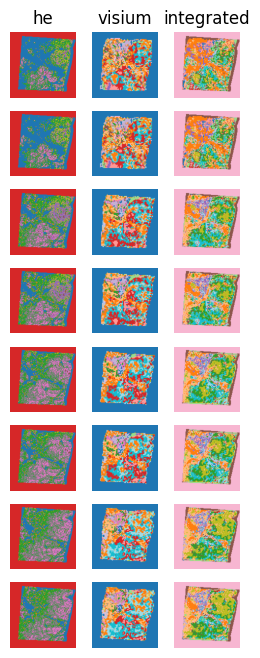

INFO:root:generating volume for he spore


2


INFO:root:generating volume for visium spore
INFO:root:generating integrated volume
INFO:root:merging cluster volumes
INFO:root:constructing graph with 116281 edges
INFO:root:2125 edges remaining after filtering
INFO:root:341 of 341 nodes processed
INFO:root:starting leiden clustering
INFO:root:finished integration, found 38 clusters


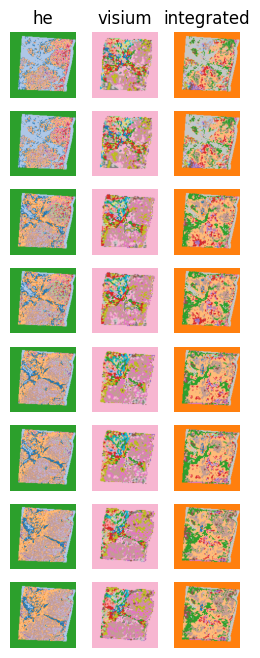

In [660]:
for level, cluster_res in enumerate(cluster_resolutions):
    print(level)
    dtype_to_volume = mushroom.generate_interpolated_volumes(
        z_scaler=z_scaler, level=level, integrate=True, dtype_to_weight=dtype_to_weights, resolution=cluster_res,
        dist_thresh=.2
    )
    dtype_to_volume_labels = {k:v.argmax(-1) if k != 'integrated' else v for k, v in dtype_to_volume.items()}

    mushroom.display_volumes(dtype_to_volume=dtype_to_volume_labels, positions=mushroom.section_positions)
    plt.show()

    pickle.dump({
        'probs': dtype_to_volume,
        'labeled': dtype_to_volume_labels
    }, open(os.path.join(out_dir, f'nbhd_volumes_l{level}.pkl'), 'wb'), protocol=4)

    del(dtype_to_volume)
    del(dtype_to_volume_labels)

In [661]:
clustering_params = {
    'z_scaler': z_scaler,
    'cluster_resolutions': cluster_resolutions,
    'dtype_to_weight': dtype_to_weights
}
yaml.safe_dump(clustering_params, open(os.path.join(out_dir, 'nbhd_volume_params.yaml'), 'w'))

In [664]:
mushroom.save()

INFO:root:saving config and outputs to /data/estorrs/mushroom/data/projects/subclone/HT268B1/mushroom_50res


In [662]:
# mushroom = Mushroom.from_config(os.path.join(project_dir, 'HT268B1', 'mushroom_50res'))

In [663]:
# for dtype in mushroom.dtypes:
#     for level in range(mushroom.num_levels):
#         print(dtype, level)
#         mushroom.display_clusters(dtype, level=level)
#         plt.show()

In [809]:
volume = pickle.load(
    open(os.path.join(mushroom.trainer_kwargs['out_dir'], f'nbhd_volumes_l1.pkl'), 'rb')
)['labeled']['visium']
dtype_to_volume = pickle.load(
    open(os.path.join(mushroom.trainer_kwargs['out_dir'], f'nbhd_volumes_l1.pkl'), 'rb')
)['labeled']
# volume = pickle.load(
#     open(os.path.join(mushroom.trainer_kwargs['out_dir'], f'nbhd_volumes_l2.pkl'), 'rb')
# )['labeled']['visium']

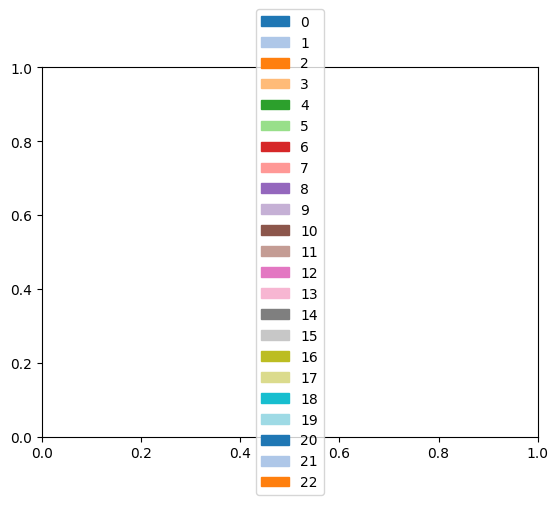

In [810]:
vis_utils.display_legend(np.unique(volume), vis_utils.get_cmap(len(np.unique(volume))))

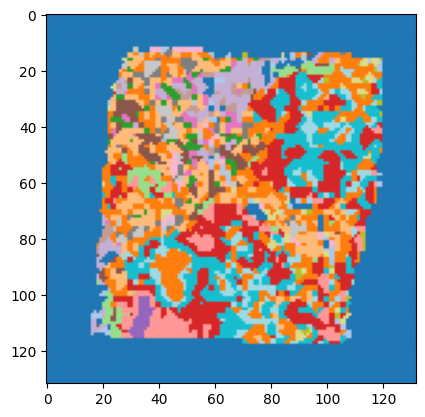

In [811]:
rgb = vis_utils.display_labeled_as_rgb(volume[1])
plt.imshow(rgb)

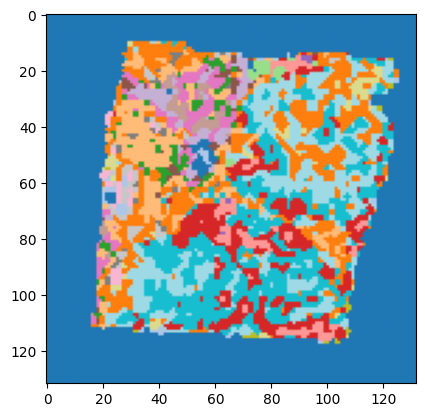

In [812]:
rgb = vis_utils.display_labeled_as_rgb(volume[-1])
plt.imshow(rgb)

In [733]:
mushroom.section_ids

[('HT268B1-U2', 'visium'),
 ('HT268B1-U2', 'he'),
 ('HT268B1-U12', 'visium'),
 ('HT268B1-U12', 'he'),
 ('HT268B1-U22', 'visium'),
 ('HT268B1-U22', 'he'),
 ('HT268B1-U32', 'visium'),
 ('HT268B1-U32', 'he')]

In [734]:
# # !cat /data/estorrs/mushroom/data/projects/subclone/mushroom/HT397B1/config.yaml
!cat /data/estorrs/mushroom/data/projects/subclone/mushroom/HT268B1/config.yaml

- data:
  - dtype: visium
    filepath: /data/estorrs/mushroom/data/projects/subclone/registered/HT268B1/s0_visium_processed.h5ad
  id: s0
  position: 0
- data:
  - dtype: visium
    filepath: /data/estorrs/mushroom/data/projects/subclone/registered/HT268B1/s1_visium_processed.h5ad
  id: s1
  position: 200
- data:
  - dtype: visium
    filepath: /data/estorrs/mushroom/data/projects/subclone/registered/HT268B1/s2_visium_processed.h5ad
  id: s2
  position: 300
- data:
  - dtype: visium
    filepath: /data/estorrs/mushroom/data/projects/subclone/registered/HT268B1/s3_visium_processed.h5ad
  id: s3
  position: 400
- data:
  - dtype: visium
    filepath: /data/estorrs/mushroom/data/projects/subclone/registered/HT268B1/s4_visium_processed.h5ad
  id: s4
  position: 500


In [735]:
config = yaml.safe_load(open('/data/estorrs/mushroom/data/projects/subclone/mushroom/HT268B1/config.yaml'))
sid_to_adata = {
    ('HT268B1-U2', 'visium'): sc.read_h5ad('/data/estorrs/mushroom/data/projects/subclone/registered/HT268B1/s1_visium_processed.h5ad'),
    ('HT268B1-U12', 'visium'): sc.read_h5ad('/data/estorrs/mushroom/data/projects/subclone/registered/HT268B1/s2_visium_processed.h5ad'),
    ('HT268B1-U22', 'visium'): sc.read_h5ad('/data/estorrs/mushroom/data/projects/subclone/registered/HT268B1/s3_visium_processed.h5ad'),
    ('HT268B1-U32', 'visium'): sc.read_h5ad('/data/estorrs/mushroom/data/projects/subclone/registered/HT268B1/s4_visium_processed.h5ad'),
}

In [736]:
for (sid, dtype), a in sid_to_adata.items():
    pts = a.obsm['spatial']
    labels = mushroom.assign_pts(pts, (sid, dtype), dtype, level=-1, volume=volume, use_volume=True)
    a.obs['nbhd'] = [f'nbhd {l}' for l in labels]
    a.obs['annotation'] = [sub if 'clone' in sub else nbhd
                           for sub, nbhd in zip(a.obs['subclone'], a.obs['nbhd'])]


In [737]:
# harmonize

In [738]:
a.obs

,in_tissue,array_row,array_col,FC1,FC2,FC3,FC4,FC5,FC6,Filtered tumor regions,...,Tumor boundary,Tumor regions,Tumor vs. TME,barcode,library_id,original,sample_id,subclone,nbhd,annotation
HT268B1-U32_AAACAAGTATCTCCCA-1,1,50,102,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACAAGTATCTCCCA-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.714296,HT268B1-U32,,nbhd 21,nbhd 21
HT268B1-U32_AAACACCAATAACTGC-1,1,59,19,3.0,466.0,3.0,466.0,3.0,466.0,1.0,...,NaN,1.0,Tumor,AAACACCAATAACTGC-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.866085,HT268B1-U32,clone_2,nbhd 12,clone_2
HT268B1-U32_AAACAGAGCGACTCCT-1,1,14,94,4.0,617.0,4.0,617.0,4.0,617.0,2.0,...,NaN,2.0,Tumor,AAACAGAGCGACTCCT-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.873439,HT268B1-U32,clone_2,nbhd 36,clone_2
HT268B1-U32_AAACAGCTTTCAGAAG-1,1,43,9,4.0,614.0,4.0,614.0,4.0,614.0,1.0,...,NaN,1.0,Tumor,AAACAGCTTTCAGAAG-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.887271,HT268B1-U32,clone_2,nbhd 32,clone_2
HT268B1-U32_AAACAGGGTCTATATT-1,1,47,13,7.0,1393.0,8.0,1453.0,unknown,0.0,1.0,...,NaN,1.0,Tumor,AAACAGGGTCTATATT-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.872409,HT268B1-U32,clone_2,nbhd 13,clone_2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT268B1-U32_TTGTTGTGTGTCAAGA-1,1,31,77,7.0,1296.0,7.0,1296.0,7.0,1296.0,2.0,...,NaN,2.0,Tumor,TTGTTGTGTGTCAAGA-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.884026,HT268B1-U32,clone_2,nbhd 36,clone_2
HT268B1-U32_TTGTTTCACATCCAGG-1,1,58,42,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTTTCACATCCAGG-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.742382,HT268B1-U32,,nbhd 12,nbhd 12
HT268B1-U32_TTGTTTCATTAGTCTA-1,1,60,30,2.0,232.0,2.0,232.0,2.0,232.0,1.0,...,NaN,1.0,Tumor,TTGTTTCATTAGTCTA-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.811824,HT268B1-U32,clone_2,nbhd 36,clone_2
HT268B1-U32_TTGTTTCCATACAACT-1,1,45,27,7.0,1234.0,7.0,1234.0,7.0,1234.0,1.0,...,NaN,1.0,Tumor,TTGTTTCCATACAACT-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.863733,HT268B1-U32,clone_2,nbhd 31,clone_2


... storing 'nbhd' as categorical
... storing 'annotation' as categorical


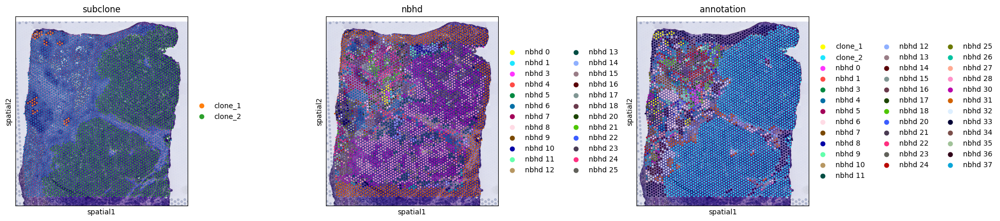

In [739]:
sc.pl.spatial(a, color=['subclone', 'nbhd', 'annotation'])

In [740]:
import anndata
combined = anndata.concat(sid_to_adata.values())
combined.obs

,in_tissue,array_row,array_col,FC1,FC2,FC3,FC4,FC5,FC6,Filtered tumor regions,...,Tumor boundary,Tumor regions,Tumor vs. TME,barcode,library_id,original,sample_id,subclone,nbhd,annotation
HT268B1-U2_AAACAAGTATCTCCCA-1,1,50,102,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,AAACAAGTATCTCCCA-1,HT268B1-Th1H3Fc2U2Z1Bs1,0.582792,HT268B1-U2,,nbhd 9,nbhd 9
HT268B1-U2_AAACACCAATAACTGC-1,1,59,19,3.0,418.0,3.0,418.0,3.0,418.0,1.0,...,NaN,1.0,Tumor,AAACACCAATAACTGC-1,HT268B1-Th1H3Fc2U2Z1Bs1,0.892656,HT268B1-U2,clone_2,nbhd 31,clone_2
HT268B1-U2_AAACAGAGCGACTCCT-1,1,14,94,3.0,483.0,3.0,483.0,3.0,483.0,2.0,...,NaN,2.0,Tumor,AAACAGAGCGACTCCT-1,HT268B1-Th1H3Fc2U2Z1Bs1,0.818513,HT268B1-U2,clone_2,nbhd 13,clone_2
HT268B1-U2_AAACAGCTTTCAGAAG-1,1,43,9,4.0,638.0,4.0,638.0,4.0,638.0,1.0,...,NaN,1.0,Tumor,AAACAGCTTTCAGAAG-1,HT268B1-Th1H3Fc2U2Z1Bs1,0.840491,HT268B1-U2,clone_2,nbhd 31,clone_2
HT268B1-U2_AAACAGGGTCTATATT-1,1,47,13,6.0,1208.0,6.0,1208.0,6.0,1208.0,1.0,...,NaN,1.0,Tumor,AAACAGGGTCTATATT-1,HT268B1-Th1H3Fc2U2Z1Bs1,0.879628,HT268B1-U2,clone_2,nbhd 13,clone_2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT268B1-U32_TTGTTGTGTGTCAAGA-1,1,31,77,7.0,1296.0,7.0,1296.0,7.0,1296.0,2.0,...,NaN,2.0,Tumor,TTGTTGTGTGTCAAGA-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.884026,HT268B1-U32,clone_2,nbhd 36,clone_2
HT268B1-U32_TTGTTTCACATCCAGG-1,1,58,42,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,0.0,TME,TTGTTTCACATCCAGG-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.742382,HT268B1-U32,,nbhd 12,nbhd 12
HT268B1-U32_TTGTTTCATTAGTCTA-1,1,60,30,2.0,232.0,2.0,232.0,2.0,232.0,1.0,...,NaN,1.0,Tumor,TTGTTTCATTAGTCTA-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.811824,HT268B1-U32,clone_2,nbhd 36,clone_2
HT268B1-U32_TTGTTTCCATACAACT-1,1,45,27,7.0,1234.0,7.0,1234.0,7.0,1234.0,1.0,...,NaN,1.0,Tumor,TTGTTTCCATACAACT-1,HT268B1-Th1H3Fc2U32Z1Bs1,0.863733,HT268B1-U32,clone_2,nbhd 31,clone_2


In [741]:
exclude = [nbhd for nbhd, val in Counter(combined.obs['nbhd']).items() if val <= 10]

# clones = [x for x in sorted(set(combined.ubs['subclone'])) if x!='']
# tups = [(clone, nbhd) for clone, nbhd in zip(combined.obs['subclone'], combined.obs['nbhd'])]
counts = Counter([nbhd for clone, nbhd in zip(combined.obs['subclone'], combined.obs['nbhd']) if clone!=''])
total_counts = Counter(combined.obs['nbhd'])

for k, v in counts.items():
    frac = v / total_counts[k]
    print(k, frac)
    if frac > .5:
        exclude.append(k)
    
# exclude.append('nbhd 0') # background

combined = combined[np.asarray([True if x not in exclude else False for x in combined.obs['nbhd']])]
combined

nbhd 31 0.8547544409613375
nbhd 13 0.7788533134772897
nbhd 33 0.546569741026806
nbhd 32 0.8311298076923077
nbhd 36 0.5518955873213176
nbhd 6 0.17059483726150393
nbhd 1 0.4523809523809524
nbhd 16 0.7125
nbhd 12 0.7385057471264368
nbhd 25 0.09259259259259259
nbhd 4 0.4377224199288256
nbhd 14 0.870253164556962
nbhd 11 0.6567164179104478
nbhd 35 0.4959349593495935
nbhd 3 0.20270270270270271
nbhd 27 0.06818181818181818
nbhd 15 0.7869822485207101
nbhd 30 0.651685393258427
nbhd 18 0.09646302250803858
nbhd 37 0.10989010989010989
nbhd 5 0.08064516129032258
nbhd 17 0.03088803088803089
nbhd 28 0.65
nbhd 20 0.06529209621993128
nbhd 26 0.048484848484848485
nbhd 21 0.017543859649122806
nbhd 34 0.25
nbhd 9 0.005571030640668524
nbhd 10 0.9245283018867925
nbhd 24 0.007594936708860759
nbhd 0 0.021505376344086023
nbhd 8 0.025


View of AnnData object with n_obs × n_vars = 4942 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'FC1', 'FC2', 'FC3', 'FC4', 'FC5', 'FC6', 'Filtered tumor regions', 'Filtered tumor regions auto', 'Filtered tumor vs. TME', 'Manual annotation', 'Morphologically processed purity', 'Purity', 'TME before boundary', 'TME boundary', 'Tumor before boundary', 'Tumor boundary', 'Tumor regions', 'Tumor vs. TME', 'barcode', 'library_id', 'original', 'sample_id', 'subclone', 'nbhd', 'annotation'
    obsm: 'spatial', 'spatial_original'

         Falling back to preprocessing with `sc.pp.pca` and default params.


... storing 'barcode' as categorical
... storing 'annotation' as categorical
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


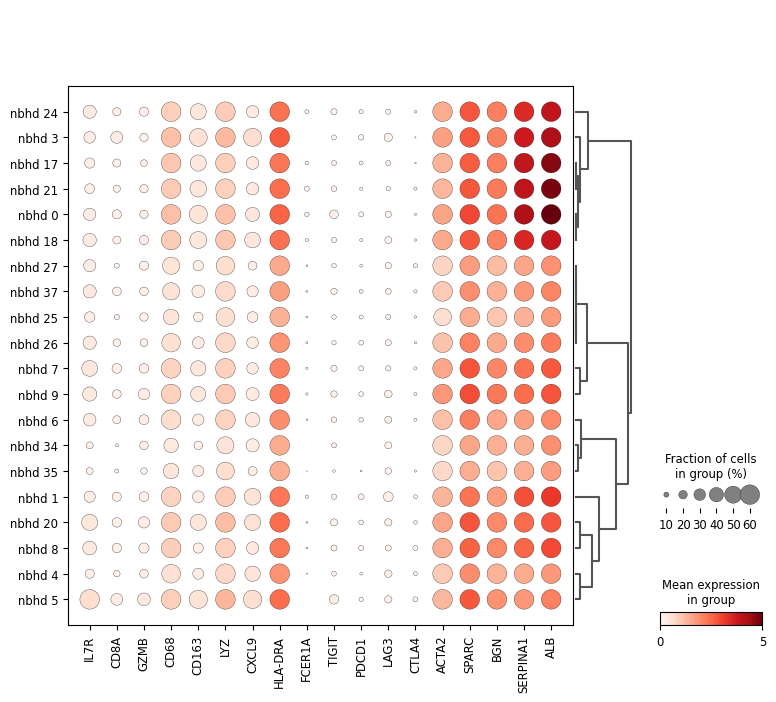

In [742]:
f = combined.copy()
f.obs['nbhd'] = f.obs['nbhd'].astype('category')
sc.tl.dendrogram(f, groupby='nbhd')
sc.pl.dotplot(
    f,
    groupby='nbhd', var_names=genes, dendrogram=True, dot_max=.6, log=True)
#     save='expression.pdf')

In [743]:
genes = [
    'IL7R', 'CD8A', 'GZMB', 'CD68', 'CD163', 'LYZ', 'CXCL9', 'HLA-DRA', 'FCER1A',
    'TIGIT', 'PDCD1', 'LAG3', 'CTLA4', 'ACTA2','SPARC', 'BGN', 'SERPINA1', 'ALB'
]

         Falling back to preprocessing with `sc.pp.pca` and default params.


... storing 'barcode' as categorical
... storing 'annotation' as categorical
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:747: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


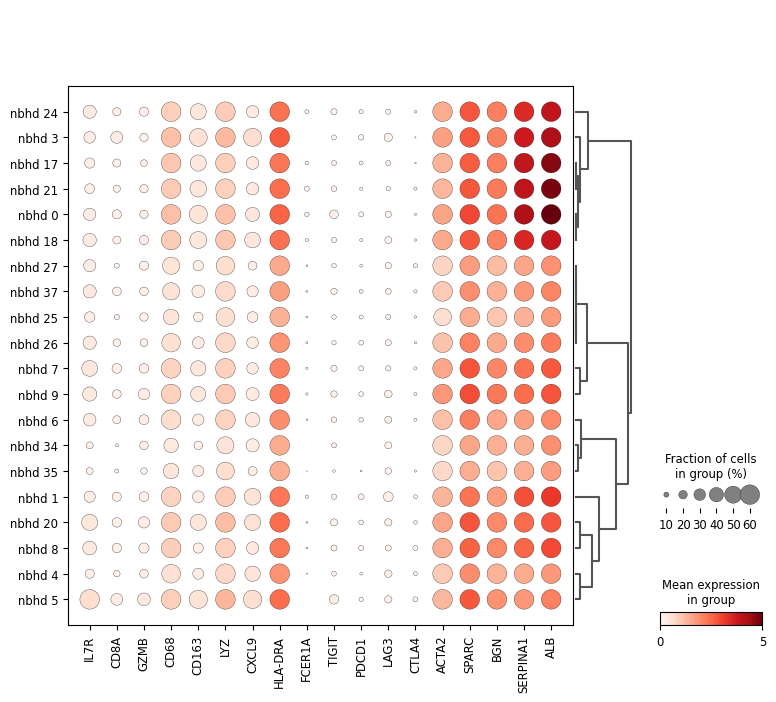

In [744]:
f = combined.copy()
f.obs['nbhd'] = f.obs['nbhd'].astype('category')
# f = f[:, genes]
sc.tl.dendrogram(f, groupby='nbhd')
sc.pl.dotplot(
    f, genes,
    groupby='nbhd', dendrogram=True, dot_max=.6, log=True)
#     save='expression.pdf')

In [747]:
dtype_to_df = mushroom.calculate_cluster_intensities(
    projection_dtype='visium', dtype_to_volume=dtype_to_volume)
dtype_to_df.keys()

dict_keys(['he', 'visium'])

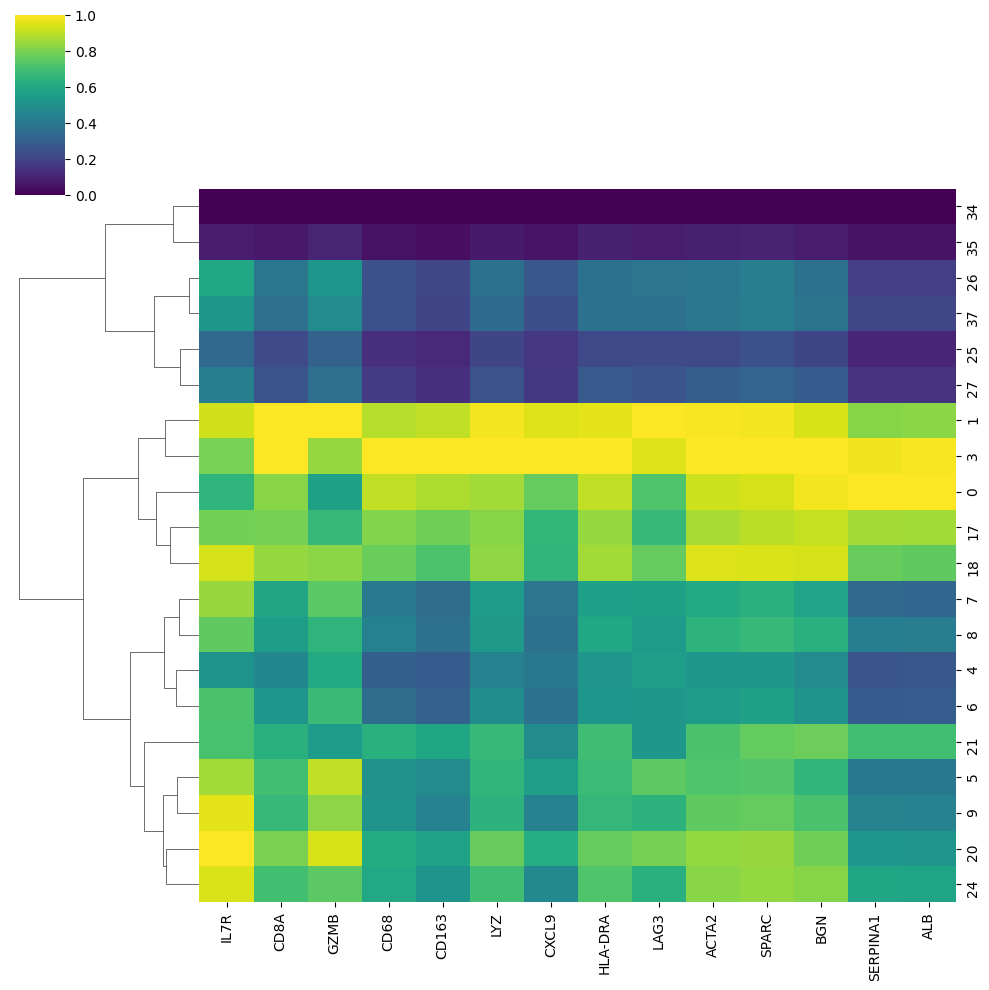

In [783]:
idxs = [int(x.replace('nbhd ', '')) for x in sorted(set(combined.obs['nbhd']))]
source = dtype_to_df['visium'].loc[idxs, [g for g in genes if g in dtype_to_df['visium'].columns]]
sns.clustermap(source, standard_scale=1, col_cluster=False, cmap='viridis')
plt.savefig('/data/estorrs/sandbox/subclone_ht268b1_heatmap.svg')

/tmp/ipykernel_2405553/2778687301.py:7: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  f.obs['annot'] = [x if x not in groups else 'highlight' for x in f.obs['nbhd']]


... storing 'barcode' as categorical
... storing 'nbhd' as categorical
... storing 'annotation' as categorical
... storing 'annot' as categorical
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:422: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:422: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:422: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:422: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
/data/

/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/data/estorrs/miniconda3/envs/mushroom/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:

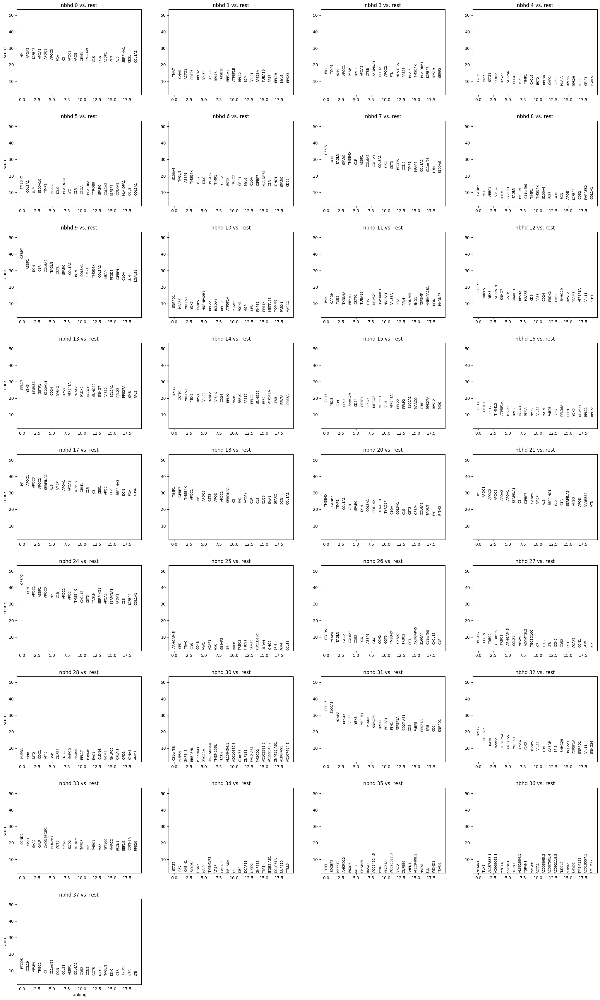

In [805]:
f = anndata.concat(sid_to_adata.values())
exclude = [nbhd for nbhd, val in Counter(f.obs['nbhd']).items() if val <= 10]
f = f[np.asarray([True if x not in exclude else False for x in f.obs['nbhd']])]

# groups = ['nbhd 4', 'nbhd 6', 'nbhd 7', 'nbhd 8']
groups = []
f.obs['annot'] = [x if x not in groups else 'highlight' for x in f.obs['nbhd']]
sc.pp.log1p(f)
sc.pp.scale(f)
sc.tl.rank_genes_groups(f, groupby='annot')
sc.pl.rank_genes_groups(f, )

In [803]:
f.uns['rank_genes_groups']['names']['highlight'][:20]

array(['S100A6', 'TMSB4X', 'IGKC', 'TAGLN', 'TIMP1', 'IGFBP7', 'AEBP1',
       'SPARC', 'PTGDS', 'MYL9', 'COL3A1', 'IFI27', 'COL1A1', 'BST2',
       'CRIP1', 'C1R', 'C1QA', 'CST3', 'COL1A2', 'LGALS1'], dtype=object)

In [807]:

for nbhd in sorted(set(f.obs['nbhd'])):
    print(nbhd, f.uns['rank_genes_groups']['names'][nbhd][:10])

nbhd 0 ['HP' 'APOA2' 'IGFBP7' 'APOA1' 'APOC1' 'APOC3' 'FGA' 'C3' 'APOC2' 'APOE']
nbhd 1 ['TMA7' 'GNAS' 'ACTG1' 'RPS26' 'RPL32' 'RPL34' 'RPL28' 'RPL15' 'TMSB10'
 'EEF1A1']
nbhd 10 ['SNRPD1' 'H2AFZ' 'MRPL51' 'YBX3' 'FABP5' 'HNRNPA2B1' 'RPL22' 'BCL2A1'
 'RPL17' 'ATP5F1A']
nbhd 11 ['PKM' 'GAPDH' 'TUBB' 'TXNL4A' 'EIF4A1' 'GSTP1' 'TUBA1B' 'FUS' 'MRPS21'
 'HSP90AB1']
nbhd 12 ['RPL17' 'MRPL51' 'YBX3' 'S100A14' 'SNHG7' 'GSTP1' 'MARCO' 'RPS4X' 'H2AFZ'
 'CD9']
nbhd 13 ['RPL17' 'YBX3' 'MRPL51' 'GSTP1' 'S100A14' 'CD24' 'RPS4X' 'RPS3' 'ATP5F1A'
 'H2AFZ']
nbhd 14 ['RPL17' 'GSTP1' 'MRPL51' 'YBX3' 'RPS3' 'RPL22' 'H2AFZ' 'RPS4X' 'CD24'
 'RPLP2']
nbhd 15 ['RPL17' 'YBX3' 'CD9' 'RPS3' 'SNHG29' 'CD24' 'GSTP1' 'RPS4X' 'MT-CO2'
 'MRPL51']
nbhd 16 ['RPL17' 'GSTP1' 'RPS12' 'TIMM13' 'ATP5F1A' 'H2AFZ' 'RPL6' 'MARCO' 'PTMA'
 'NME2']
nbhd 17 ['HP' 'APOC1' 'APOC3' 'APOC2' 'SERPINA1' 'ALB' 'AMBP' 'APOA1' 'APOA2'
 'IGFBP7']
nbhd 18 ['TIMP1' 'IGFBP7' 'TMSB4X' 'APOC1' 'HP' 'APOC3' 'CST3' 'APOE' 'APOC2'
 'SERPINA1']
nbhd

In [806]:
for nbhd in ['nbhd 4', 'nbhd 6', 'nbhd 7', 'nbhd 8']:
    print(nbhd, f.uns['rank_genes_groups']['names'][nbhd][:10])

nbhd 4 ['ISG15' 'IFI27' 'STAT1' 'COMP' 'RPS27' 'S100A6' 'RPL41' 'IFI30' 'TIMP1'
 'CXCL9']
nbhd 6 ['S100A6' 'TAGLN' 'AEBP1' 'TMSB4X' 'IFI27' 'IGKC' 'PTGDS' 'TIMP1' 'IGLC2'
 'BST2']
nbhd 7 ['IGFBP7' 'DCN' 'TAGLN' 'SPARC' 'TMSB4X' 'C1R' 'AEBP1' 'COL6A2' 'COL1A1'
 'COL3A1']
nbhd 8 ['IGFBP7' 'BST2' 'AEBP1' 'SPARC' 'IFITM3' 'LGALS1' 'TAGLN' 'EMILIN1'
 'C11orf96' 'TIMP1']


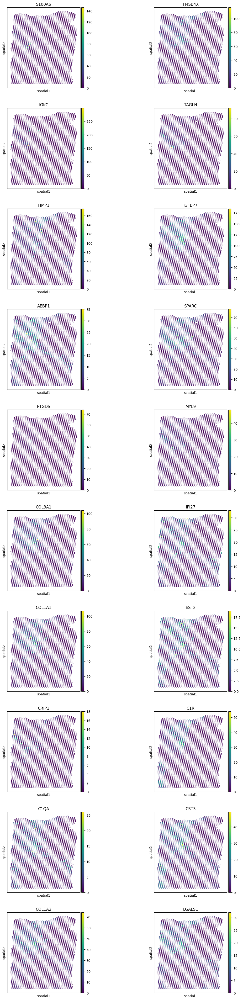

In [804]:
sc.pl.spatial(a, color=f.uns['rank_genes_groups']['names']['highlight'][:20], ncols=2, alpha_img=0)

In [784]:
mapping = {
    4: (98, 94, 196),
    6: (60, 185, 199),
    7: (63, 191, 112),
    8: (160, 189, 57),
}

cmap = sns.color_palette('tab20') + sns.color_palette('tab20b')
for i in range(len(cmap)):
    if i in mapping:
        cmap[i] = np.asarray(mapping[i]) / 255.
cmap

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 array([0.38431373, 0.36862745, 0.76862745]),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 array([0.23529412, 0.7254902 , 0.78039216]),
 array([0.24705882, 0.74901961, 0.43921569]),
 array([0.62745098, 0.74117647, 0.22352941]),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7803921568627451, 0.7803921568627451, 0.7803921568627451),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.8588235294117647, 

(-0.5, 131.5, 131.5, -0.5)

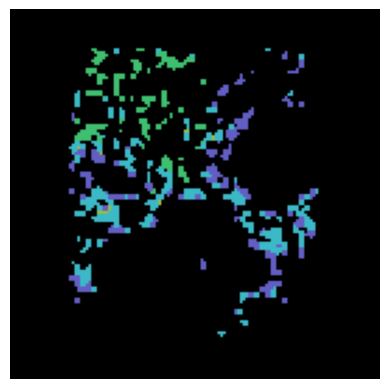

In [785]:

rgb = get_nbhd_rgb(volume[1], [4,6,8,7], cmap=cmap)
plt.imshow(rgb)
plt.axis('off')

(-0.5, 131.5, 131.5, -0.5)

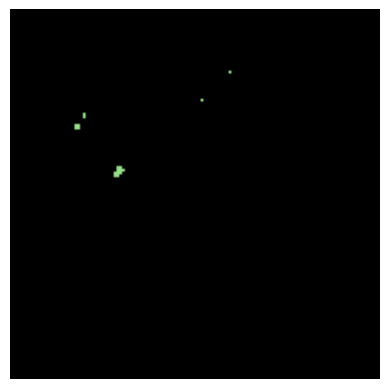

In [808]:

rgb = get_nbhd_rgb(volume[-1], [5], cmap=None)
plt.imshow(rgb)
plt.axis('off')

(-0.5, 131.5, 131.5, -0.5)

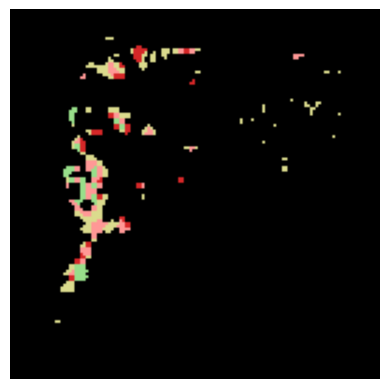

In [757]:

rgb = get_nbhd_rgb(volume[-1], [37, 26, 27, 25], cmap=None)
plt.imshow(rgb)
plt.axis('off')

(-0.5, 131.5, 131.5, -0.5)

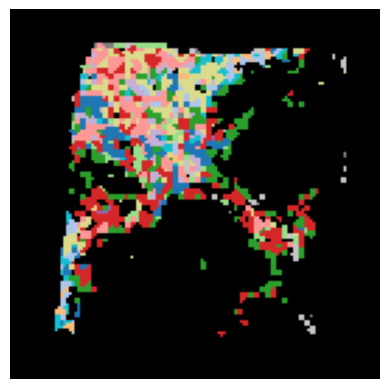

In [755]:

rgb = get_nbhd_rgb(volume[1], idxs, cmap=None)
plt.imshow(rgb)
plt.axis('off')

In [120]:
components = {
    'Fibroblast': ['ACTA2', 'COL17A1', 'MYH11', 'CNN1'],
    'T cell': ['CD3D', 'CD3E', 'IL7R', 'CD2', 'CD247'],
#     'NK cell': ['GZMK', 'GNLY', 'KLRB1', 'KLRD1', 'NCAM1'],
#     'B cell': ['MS4A1'],
    'Macrophage': ['CD68', 'CD163'],
    'Epithelial': ['EPCAM'],
    'Endothelial': ['PECAM1'],
#     'Epithelial - CCRCC': ['LRP2', 'CA9'],
}

def score_gene_set(df, gene_set):
    data = []
    order = sorted(gene_set.keys())
    for name in order:
        genes = gene_set[name]
        f = df[[c for c in df.columns if c in genes]]
        data.append(f.values.mean(1).flatten())
    scored = pd.DataFrame(data=data, columns=df.index, index=order).T
    return scored

In [121]:
exp_df = mushroom.calculate_cluster_intensities(projection_dtype='integrated')['visium']
scored = score_gene_set(exp_df, components)
scored

,Endothelial,Epithelial,Fibroblast,Macrophage,T cell
0,0.081356,-0.211822,-0.036660,0.096441,0.069215
1,1.325909,3.525831,2.103899,1.286533,0.606179
2,1.073618,1.742371,1.270827,0.980336,0.682709
3,0.084112,-0.267929,-0.052331,0.124142,0.083980
4,0.890424,0.641176,0.757554,0.876076,0.641420
5,1.075014,2.447429,1.533745,1.025354,0.583805
6,0.056469,-0.262047,-0.058887,0.113716,0.072343
7,1.073831,1.925466,1.346786,1.003606,0.652330
8,0.503276,0.330082,0.431040,0.547767,0.391002
9,0.499259,0.339825,0.420242,0.507140,0.370155


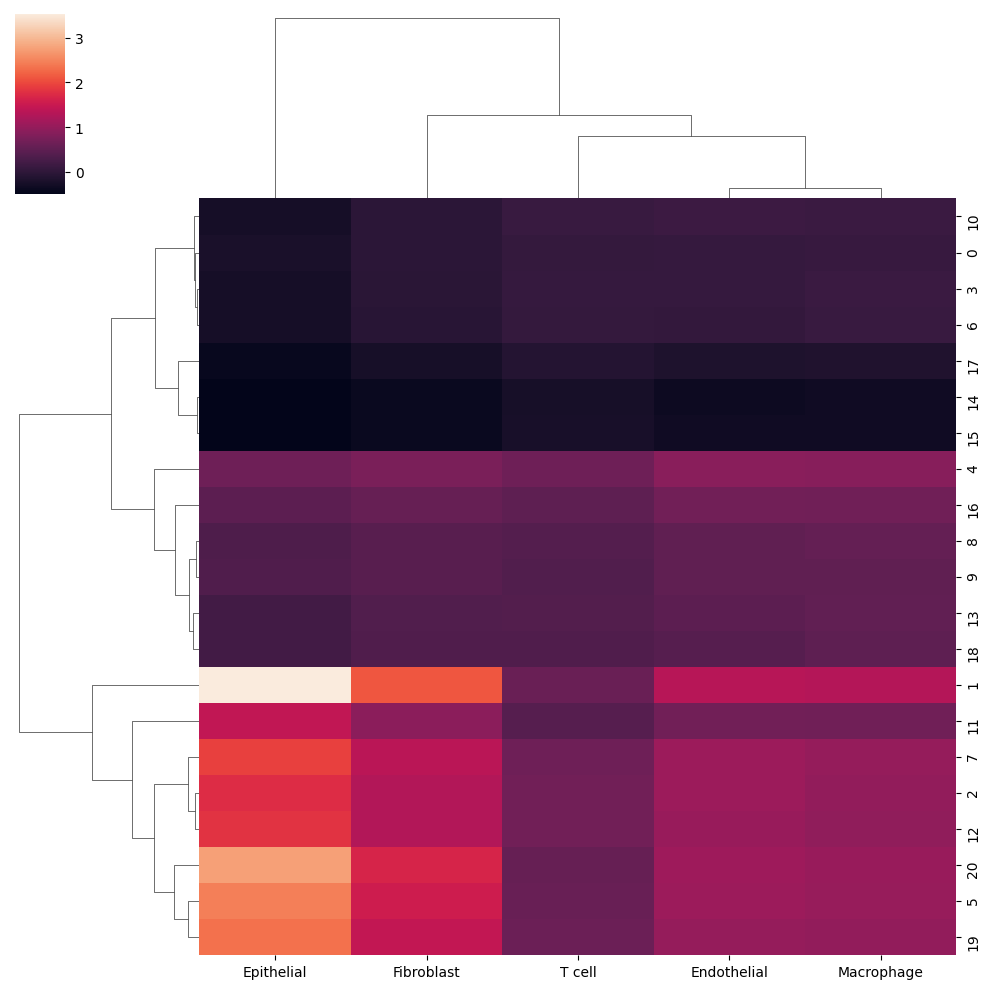

In [127]:
sns.clustermap(scored)

KeyError: 'Could not find key TME_boundary in .var_names or .obs.columns.'

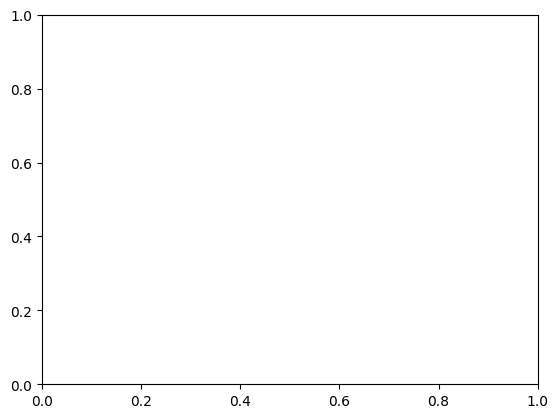

In [131]:
sc.pl.spatial(a, color=['TME_boundary'], alpha_img=0, vmax=2.)